In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 16
GEN_IN_CHANNELS = 1
GEN_N_CLASSES = 1
DIS_IN_CHANNELS = 1
DIS_N_CLASSES = 1
EPOCH = 100

### Model Settings

#### head

In [5]:
GEN_ACT = "sigmoid"
DIS_ACT = "sigmoid"

### Optimizer Settings

In [6]:
GEN_OPTIM_NAME = "adam"
GEN_init_lr = 3e-4
GEN_momentum = 0.9

In [7]:
DIS_OPTIM_NAME = "adam"
DIS_init_lr = 1e-3
DIS_momentum = 0.9

# Epochs

In [8]:
from codes.activation import Activation
from kornia.filters.canny import Canny

In [9]:
def set_requires_grad(nets, requires_grad=False):
    """Set requies_grad=Fasle for all the networks to avoid unnecessary computations
    Parameters:
    nets (network list)   -- a list of networks
    requires_grad (bool)  -- whether the networks require gradients or not
    """
    if not isinstance(nets, list):
        nets = [nets]
        for net in nets:
            if net is not None:
                for param in net.parameters():
                    param.requires_grad = requires_grad

In [10]:
def replace_relu_to_leakyReLU(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.ReLU):
            setattr(model, child_name, nn.LeakyReLU())
        else:
            replace_relu_to_leakyReLU(child)

In [11]:
def replace_bn_to_instanceNorm(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.BatchNorm2d):
            bn = getattr(model, child_name)
            setattr(model, child_name, nn.InstanceNorm2d(bn.num_features))
        else:
            replace_bn_to_instanceNorm(child)

In [12]:
canny_filter = Canny(low_threshold=0, high_threshold=0.1).to(device)

In [13]:
def train_a2b_epoch(generator, gen_optimizer, discriminator, dis_optimizer, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.train().to(device)
    discriminator = discriminator.train().to(device)
    
    dis_l = 0
    gen_l = 0

    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
#         edge_y_ = generator(edge_x)
#         edge_y_ = Activation(name=GEN_ACT)(edge_y_) # zipped value to [0, 1]
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        set_requires_grad(discriminator, True)
        dis_optimizer.zero_grad()
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
#         y_cls_ = discriminator(edge_y)
        
        y_pr_cls = discriminator(edge_y_pr.detach())
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
       
        _dis = nn.BCELoss()(y_cls.float(), torch.zeros(y_cls.size(), dtype=torch.float, device=device)) + \
                                nn.BCELoss()(y_pr_cls.float(), torch.ones(y_pr_cls.size(), dtype=torch.float, device=device))

        _dis.backward()
        dis_optimizer.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        set_requires_grad(discriminator, False)
        gen_optimizer.zero_grad()

        # adversarial loss
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        _gen = nn.BCELoss()(y_pr_cls.float(), torch.zeros(y_pr_cls.size(), dtype=torch.float, device=device))

        _gen.backward()    
        gen_optimizer.step()

        dis_l += _dis.item()
        gen_l += _gen.item()
        
    return  gen_l/(index+1), dis_l/(index+1)

In [14]:
@torch.no_grad()
def eval_epoch(generator, discriminator, dataloader, device):
  
    # change mode to train and move to current device
    generator = generator.eval().to(device)
    discriminator = discriminator.eval().to(device)

    acc_ = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = generator(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)
        
        # adversarial
        acc = Accuracy()(y_cls, torch.zeros(y_cls.size(), device=y_cls.device))
        acc_ += [acc.item()]
        acc = Accuracy()(y_pr_cls, torch.ones(y_pr_cls.size(), device=y_pr_cls.device))
        acc_ += [acc.item()]


    return  sum(acc_)/len(acc_)

In [43]:
@torch.no_grad()
def test_epoch(model, dataloader, device, save=False, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)  

        edge_y_pr = model(edge_x)
        edge_y_pr = Activation(name=GEN_ACT)(edge_y_pr) # zipped value to [0, 1]
        
        y_cls = discriminator(edge_y)
        y_cls = Activation(name=DIS_ACT)(y_cls)
        y_pr_cls = discriminator(edge_y_pr)
        y_pr_cls = Activation(name=DIS_ACT)(y_pr_cls)   
        
        for b in range(x.shape[0]):
            
            print("edge of ct_pred = {}, edge of ct_true = {}".format(y_pr_cls[b, :].squeeze().item(), y_cls[b, :].squeeze().item()))
            print(torch.unique(edge_y[b, :]), torch.unique(edge_y_pr[b, :]))
            
            _edge = (edge_y[b, :].squeeze().cpu().numpy() * 255).astype(np.uint8)
            _edge_pr = (edge_y_pr[b, :].squeeze().cpu().numpy() * 255).astype(np.uint8)
            
            visualize(
                edge_true = _edge,
                edge_pred = _edge_pr
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "edge_pred.jpg"), _edge_pr)
                cv2.imwrite(os.path.join(path_dir, "edge_true.jpg"), _edge)
                
            iid += 1

# Discriminator

In [16]:
from codes.activation import Activation
import torchvision.models as models

In [17]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet152()
        encoder.layer2 = nn.Identity()
        encoder.layer3 = nn.Identity()
        encoder.layer4 = nn.Identity()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=256, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# Read Data

In [18]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [19]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [20]:
trainset = Dataset(train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [21]:
len(trainset), len(testset)

(1344, 191)

In [22]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7f9b20521490>,)

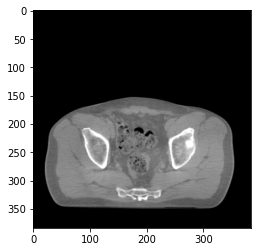

In [23]:
plt.imshow(x.squeeze(), 'gray'),

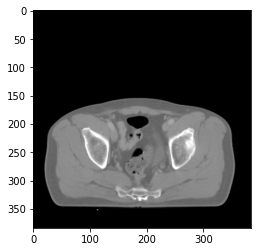

In [24]:
plt.imshow(y.squeeze(), 'gray')

In [25]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# training

In [26]:
import wandb

wandb.init(project="cbct_edge", config={
    "data": {
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "in_channels": GEN_IN_CHANNELS,
        "out_channels": GEN_N_CLASSES,
        "optimizer": GEN_OPTIM_NAME,
        "init_lr": GEN_init_lr,
        "momentum": GEN_momentum,
        "activation": GEN_ACT,
    },
    "discriminator": {
        "in_channels": DIS_IN_CHANNELS,
        "out_channels": DIS_N_CLASSES,
        "optimizer": DIS_OPTIM_NAME,
        "init_lr": DIS_init_lr,
        "momentum": DIS_momentum,
        "encoder": "resnet152"
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)


In [27]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [28]:
import segmentation_models_pytorch as smp
import torchvision.models as models
from codes.autoencoder import AutoEncoder

model = AutoEncoder(in_channels=GEN_IN_CHANNELS, head_channels=GEN_N_CLASSES)

In [29]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [30]:
model

AutoEncoder(
  (encoder): Encoder(
    (blocks): Sequential(
      (0): DownBlock(
        (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU()
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
      (1): DownBlock(
        (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU()
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
      (2): DownBlock(
        (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU()
        (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
      (3): DownBlock(
        (conv1): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (relu): ReLU()
        (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      )
      (4): DownBlock(
        (conv1): Conv2d(512, 10

In [31]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
gen_optimizer = Optimizer(model.parameters(), name=GEN_OPTIM_NAME)
dis_optimizer = Optimizer(discriminator.parameters(), name=DIS_OPTIM_NAME, lr=DIS_init_lr)

In [32]:
wandb.watch(model)
wandb.watch(discriminator)

max_score = 0

for epoch in range(EPOCH):
        
        loss_gen, loss_dis = train_a2b_epoch(model, gen_optimizer, discriminator, dis_optimizer, trainloader, device)
        score_acc_train = eval_epoch(model, discriminator, trainloader, device)
        score_acc_test = eval_epoch(model, discriminator, testloader, device)

        
        wandb.log({
            "loss gen": loss_gen,
            "loss dis": loss_dis,
            "trainset acc score": score_acc_train,
            "testset acc score": score_acc_test
        })
        
        
        if score_acc_test  >  max_score:
            max_score = score_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": gen_optimizer.state_dict(),
                "dicriminator": discriminator.state_dict(),
                "dis_optim": dis_optimizer.state_dict()
            }
            torch.save(checkpoint, os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

0it [00:00, ?it/s]/opt/conda/lib/python3.8/site-packages/torch/nn/functional.py:3032: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "
84it [02:02,  1.46s/it]
84it [01:24,  1.00s/it]
12it [00:12,  1.01s/it]
84it [02:04,  1.48s/it]
84it [01:24,  1.01s/it]
12it [00:12,  1.03s/it]
84it [01:59,  1.42s/it]
84it [01:29,  1.06s/it]
12it [00:12,  1.01s/it]
84it [02:03,  1.47s/it]
84it [01:25,  1.02s/it]
12it [00:10,  1.18it/s]
84it [02:01,  1.44s/it]
84it [01:23,  1.00it/s]
12it [00:12,  1.03s/it]
84it [02:03,  1.47s/it]
84it [01:23,  1.01it/s]
12it [00:12,  1.02s/it]
84it [01:58,  1.41s/it]
84it [01:27,  1.05s/it]
12it [00:12,  1.02s/it]
84it [02:04,  1.49s/it]
84it [01:27,  1.04s/it]
12it [00:11,  1.01it/s]
84it [02:10,  1.56s/it]
84it [01:25,  1.02s/

In [33]:
checkpoint = torch.load(os.path.join("weight-edge", "{}.pth".format(wandb.run.name)))

In [34]:
model = AutoEncoder(in_channels=GEN_IN_CHANNELS, head_channels=GEN_N_CLASSES)

In [37]:
dir_path = os.path.join("eval-edge", wandb.run.name)
try:
    os.mkdir(dir_path)
except FileExistsError:
    pass

0it [00:00, ?it/s]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

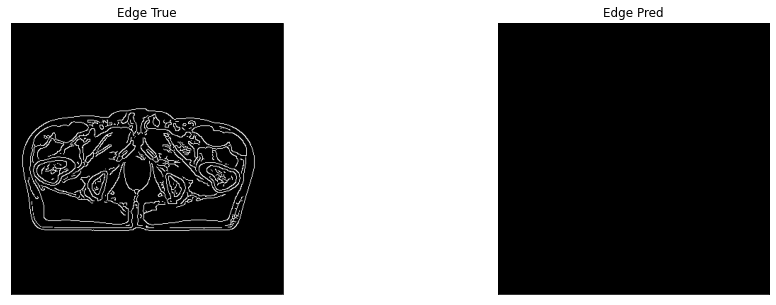

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

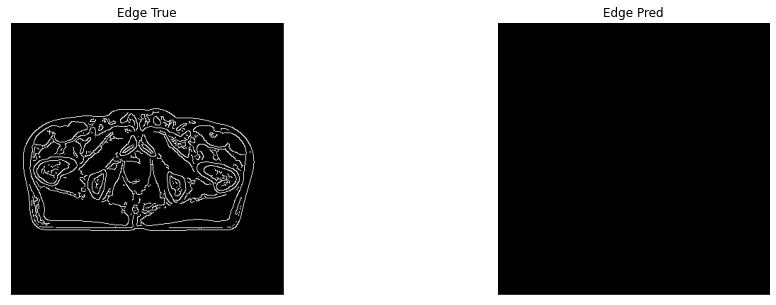

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

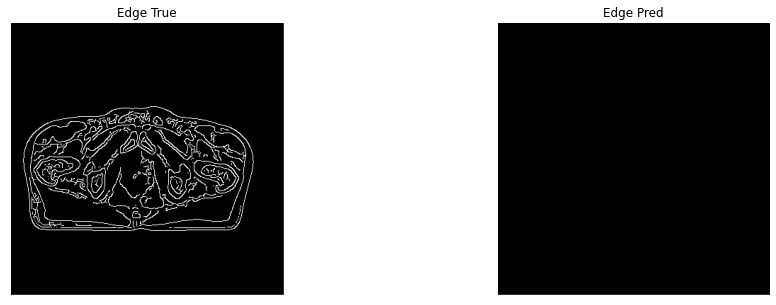

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

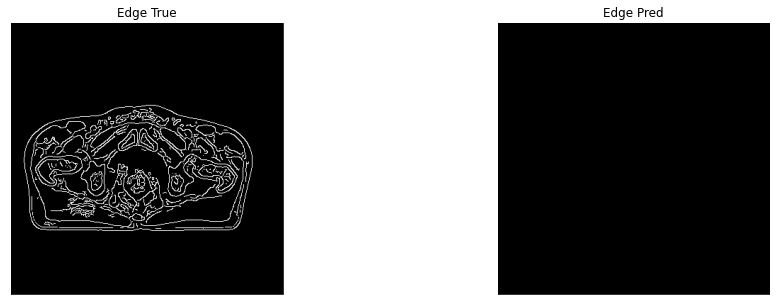

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

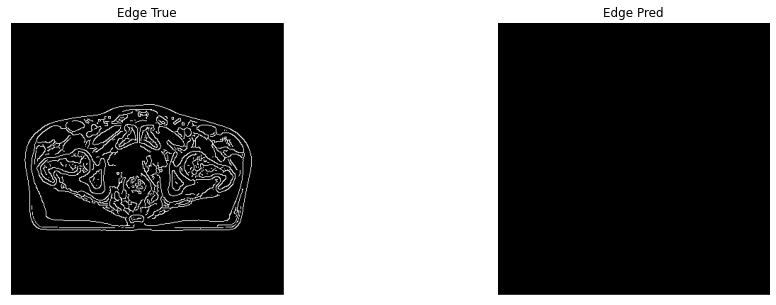

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

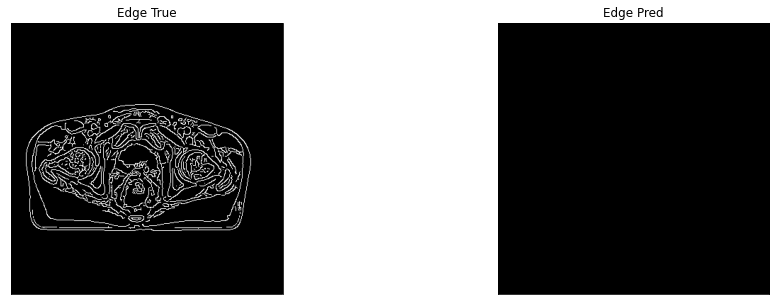

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

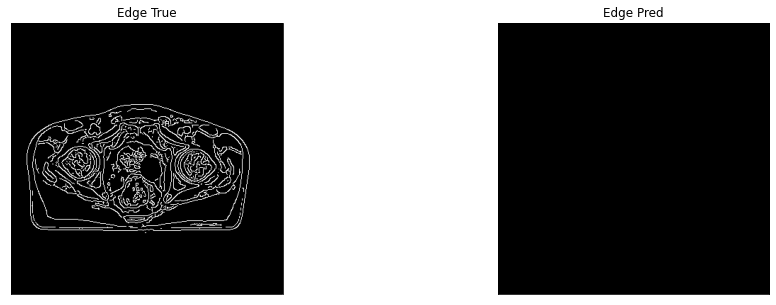

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

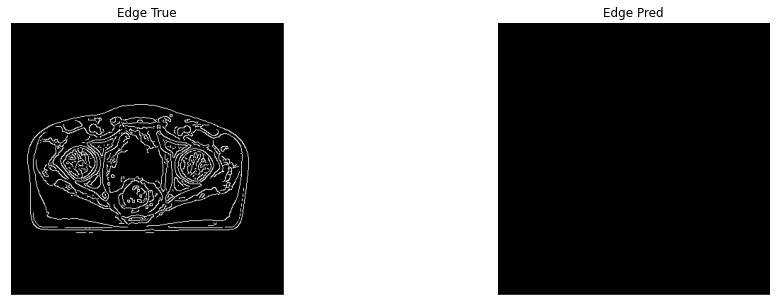

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

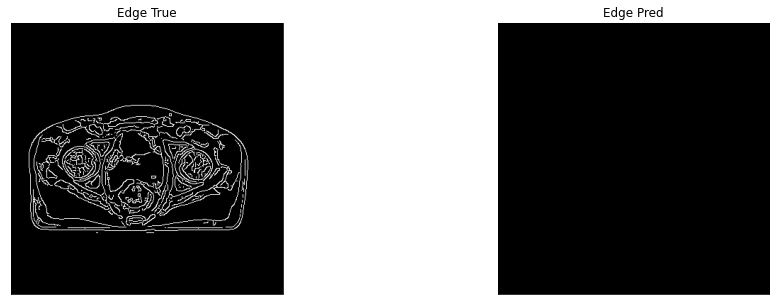

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

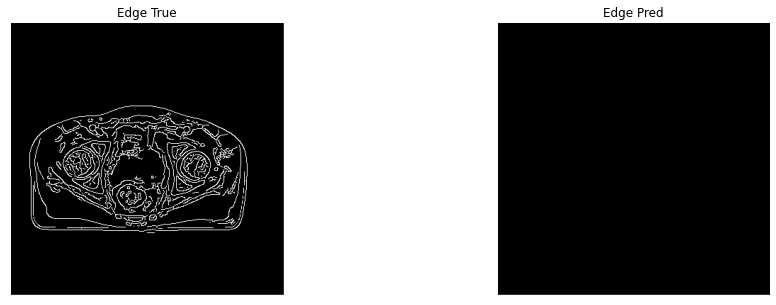

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

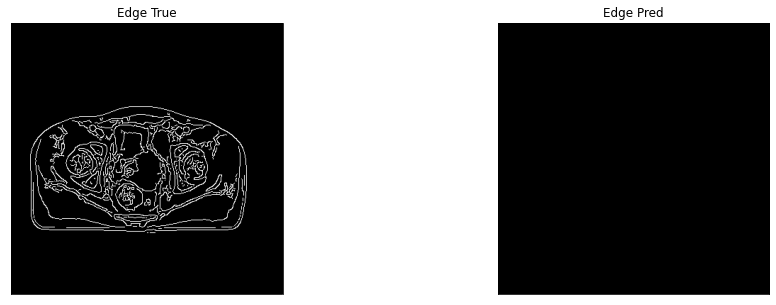

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

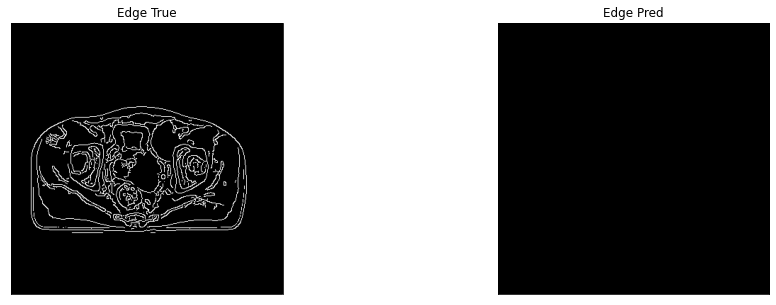

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

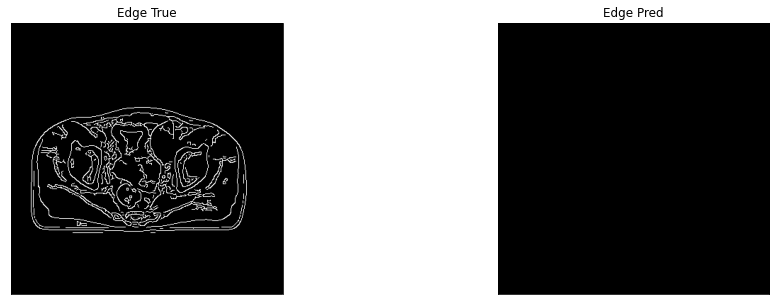

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

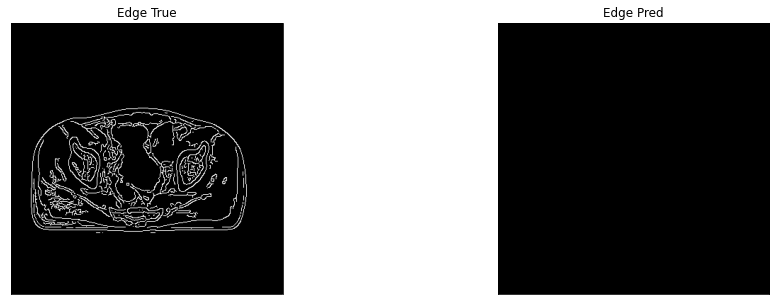

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

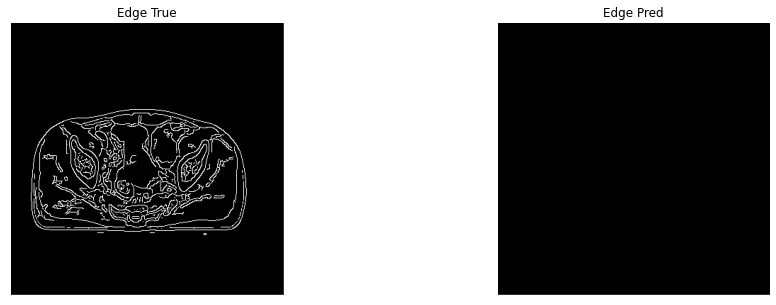

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

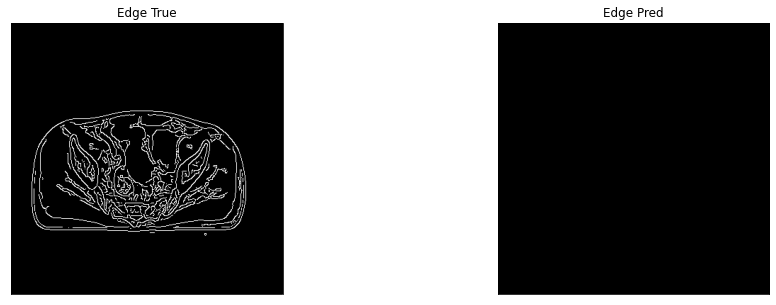

1it [00:03,  3.68s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

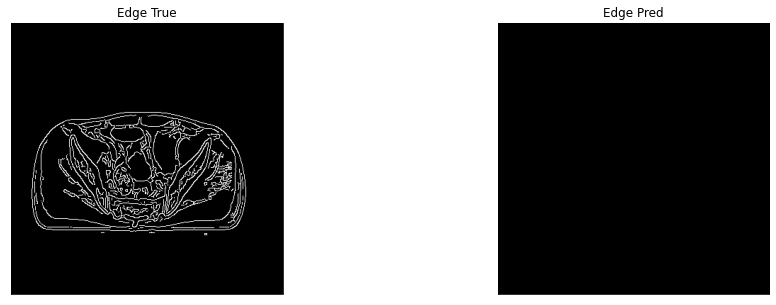

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

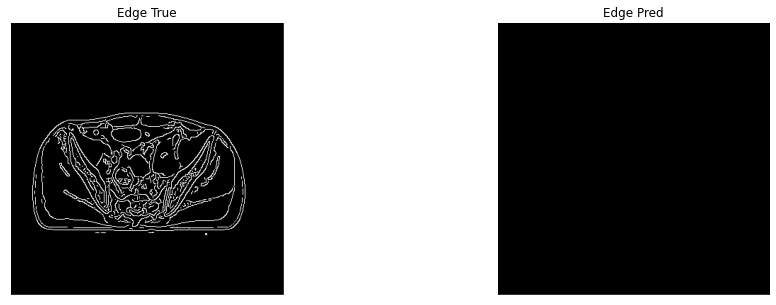

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

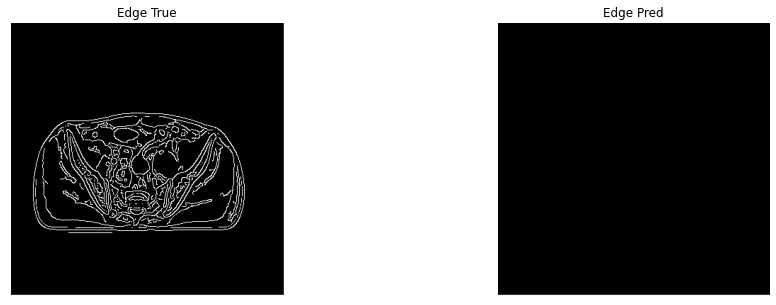

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

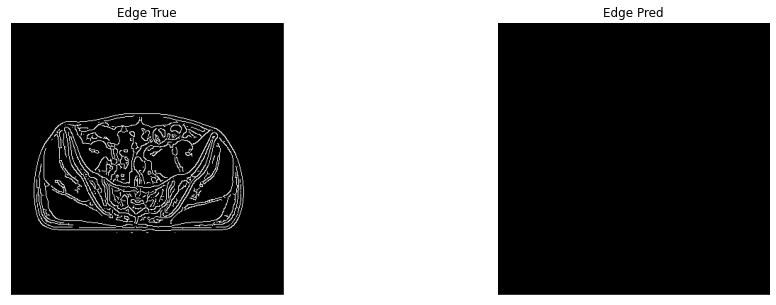

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

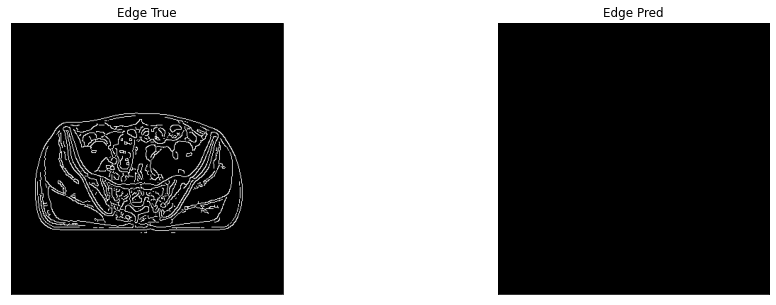

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

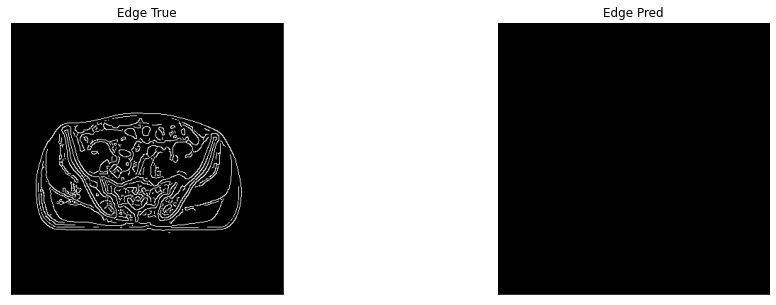

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

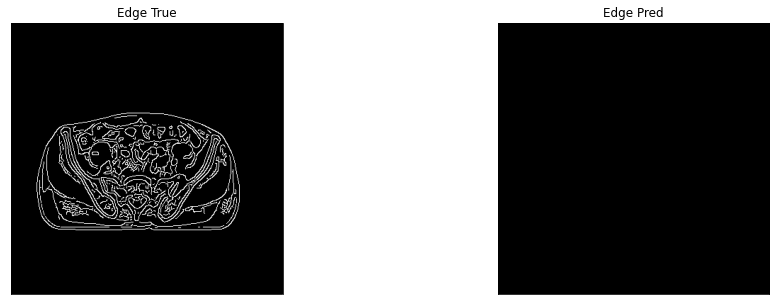

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

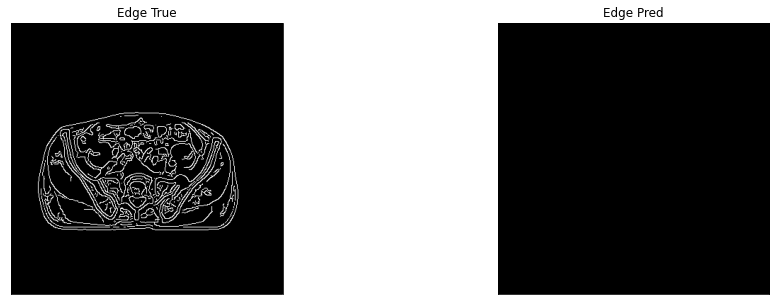

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

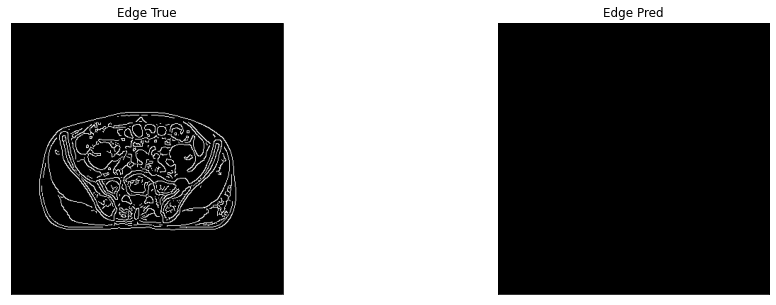

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

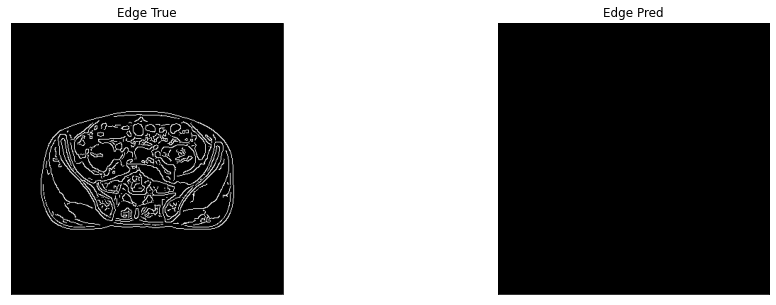

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

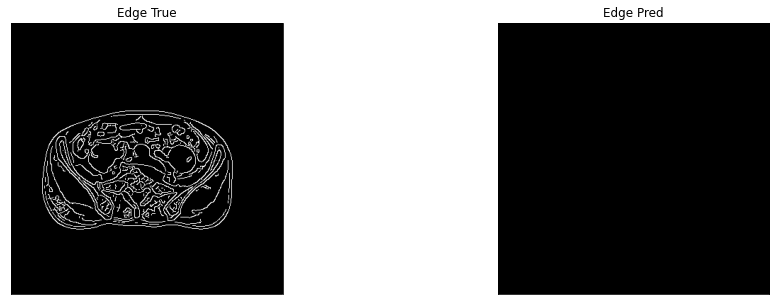

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

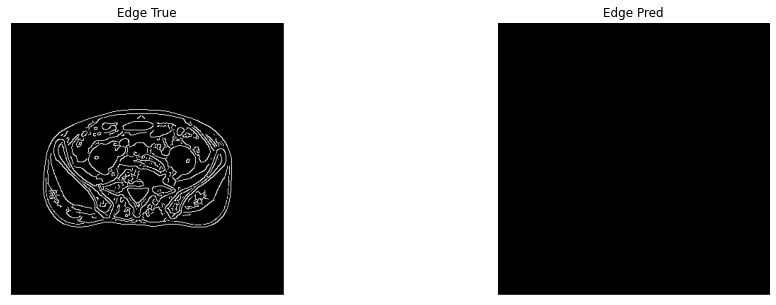

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

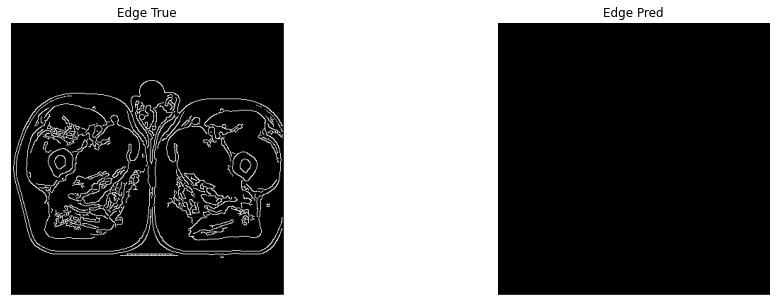

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

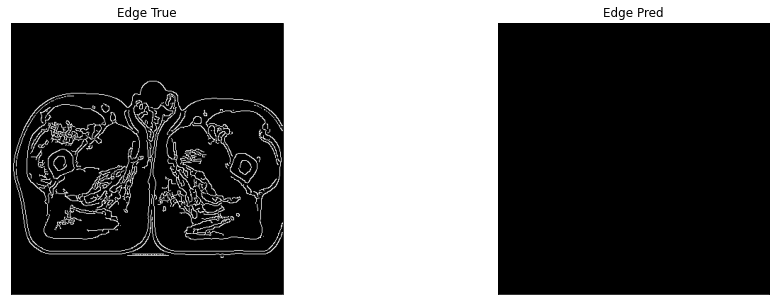

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

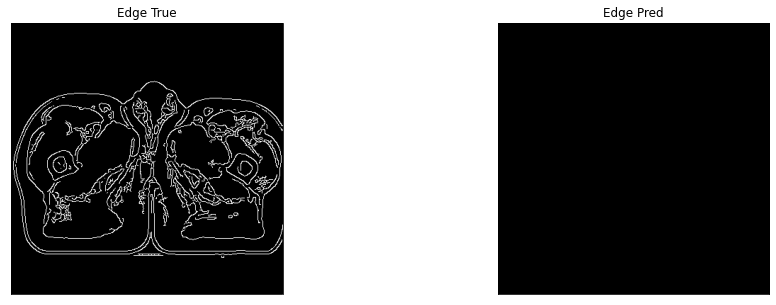

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

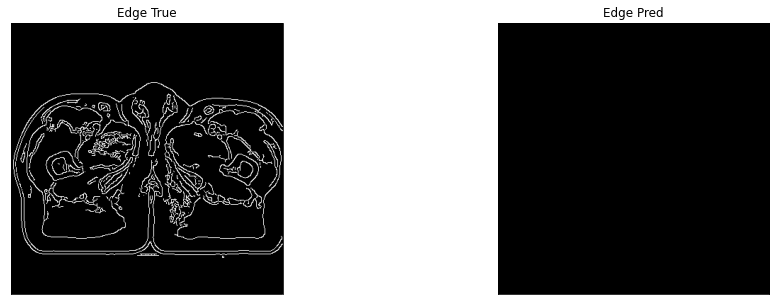

2it [00:06,  3.45s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

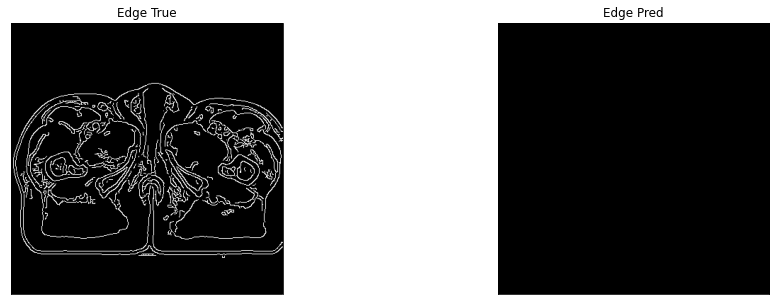

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

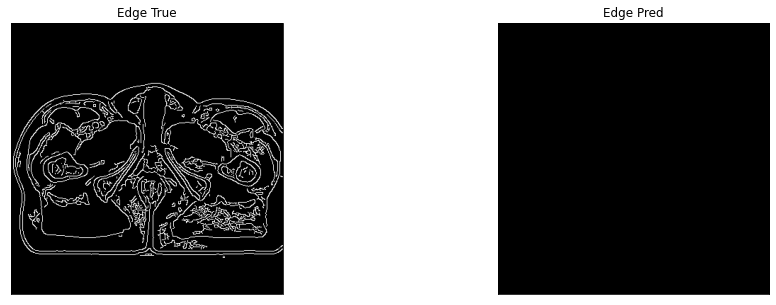

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

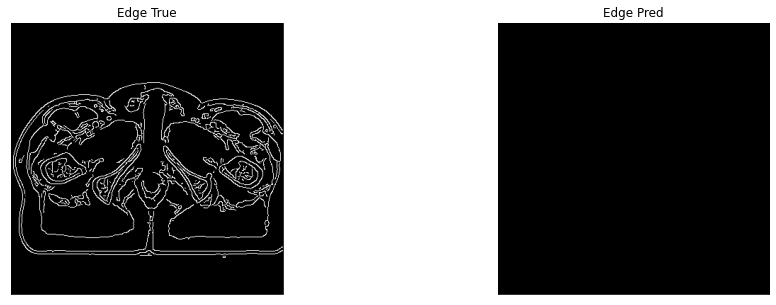

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

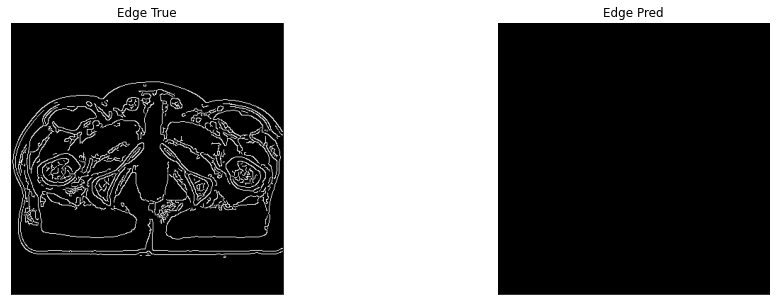

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916,
        0.4916, 0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

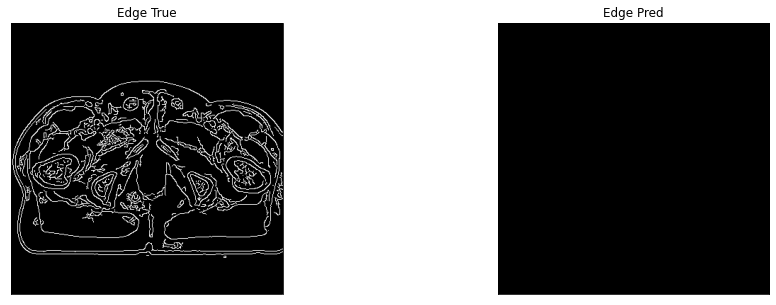

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

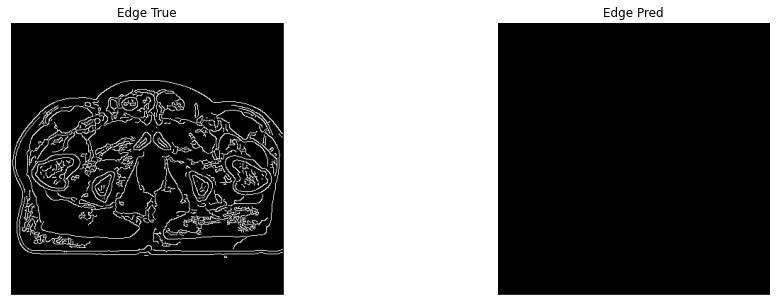

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

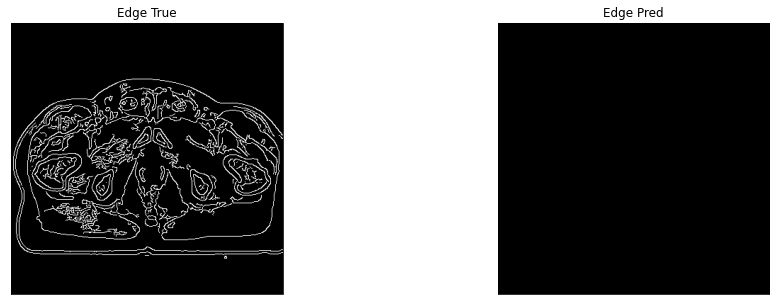

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

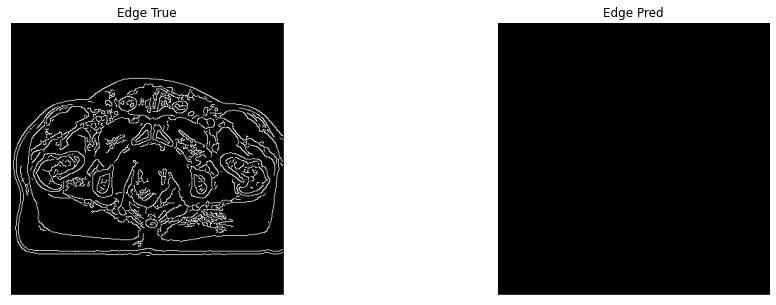

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

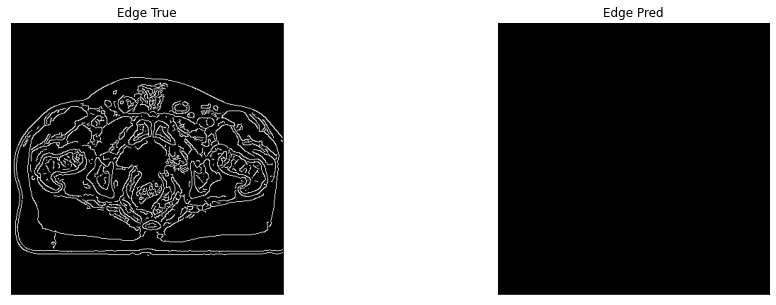

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

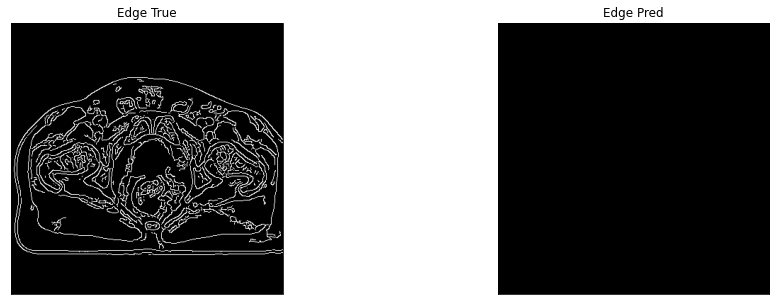

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

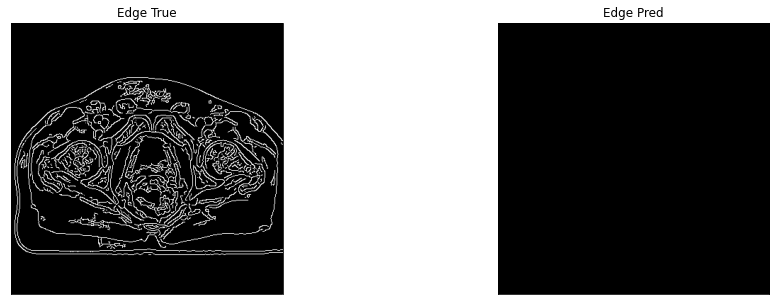

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

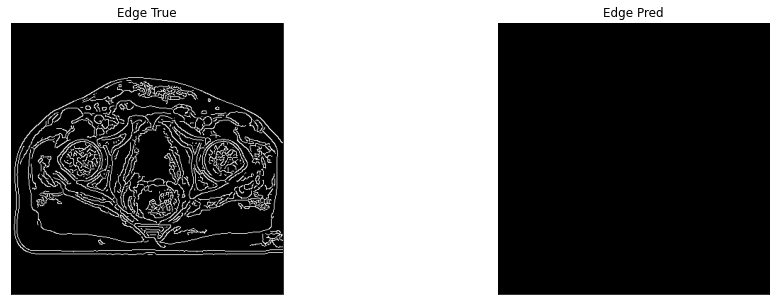

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

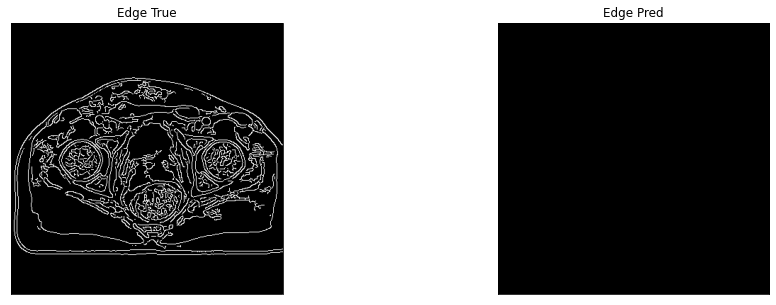

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

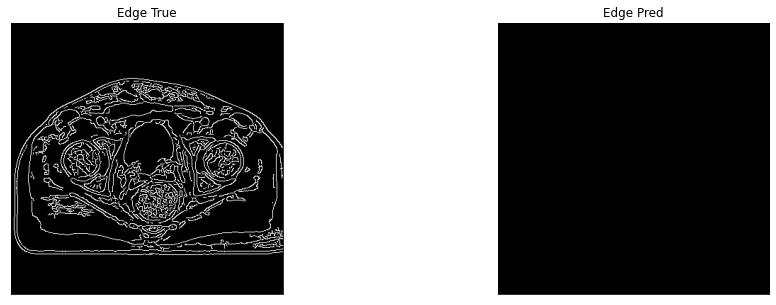

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

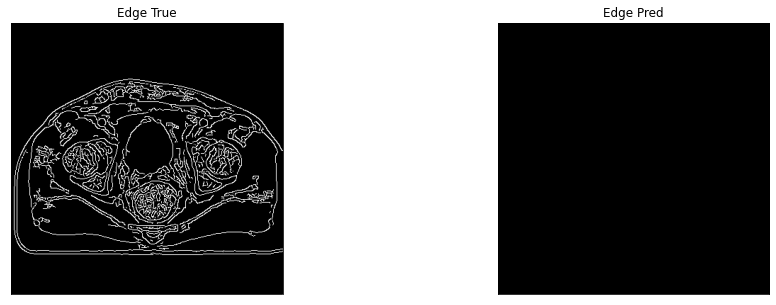

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

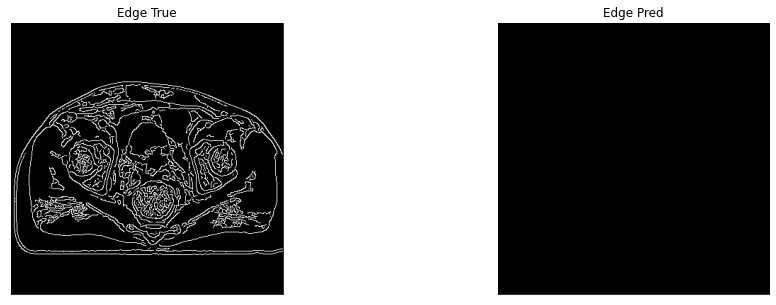

3it [00:09,  3.39s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

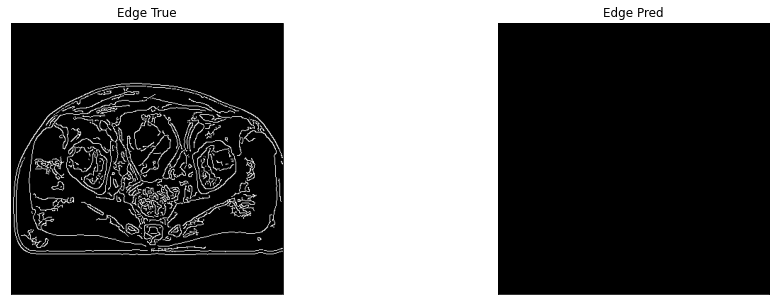

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

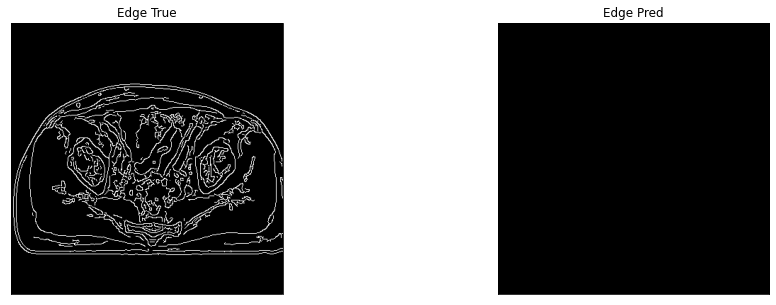

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

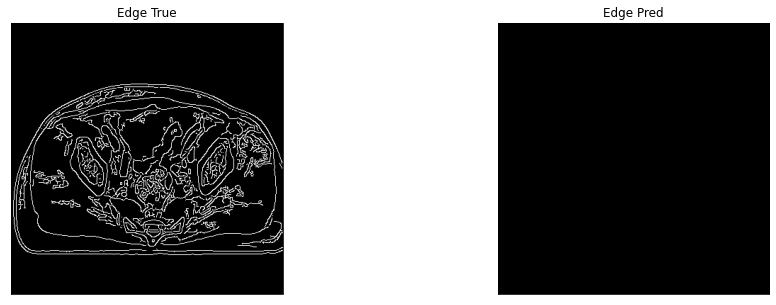

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

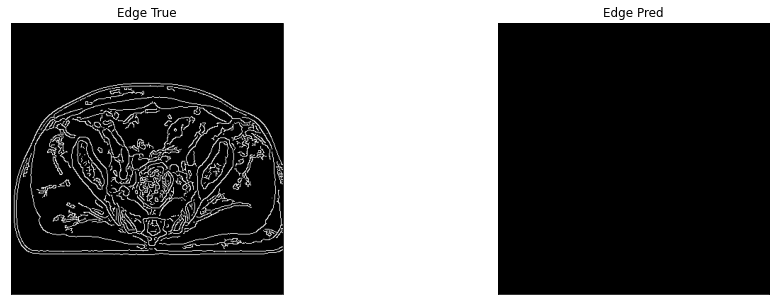

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

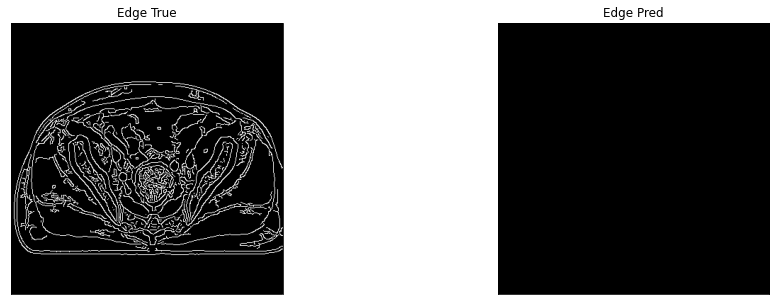

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

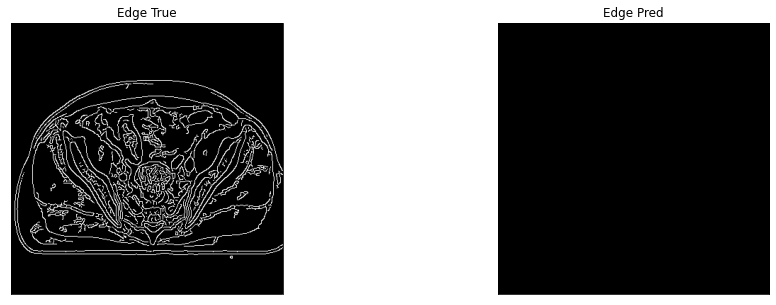

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

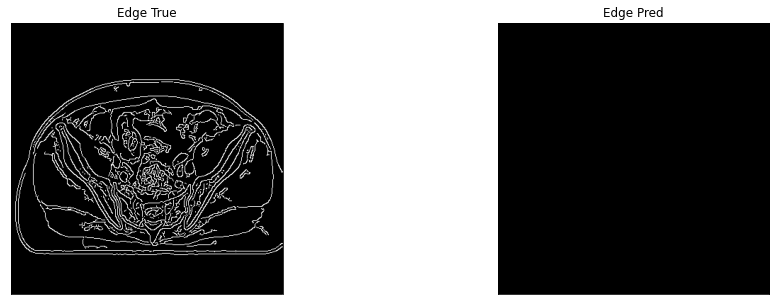

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

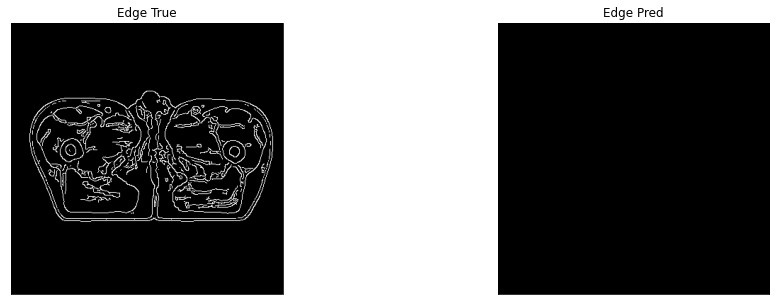

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

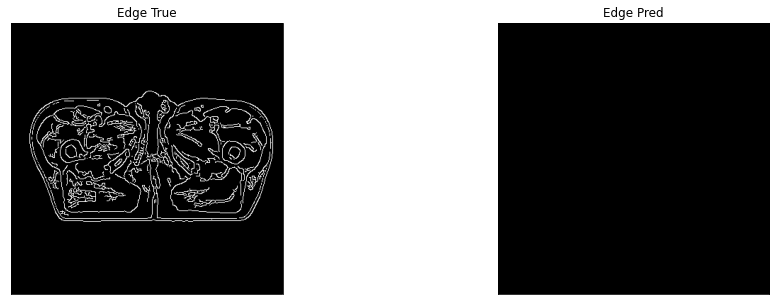

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

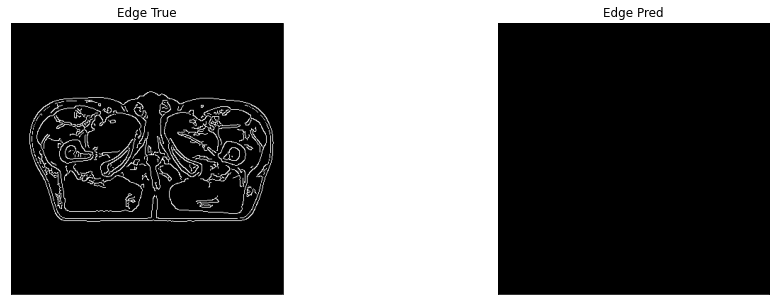

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

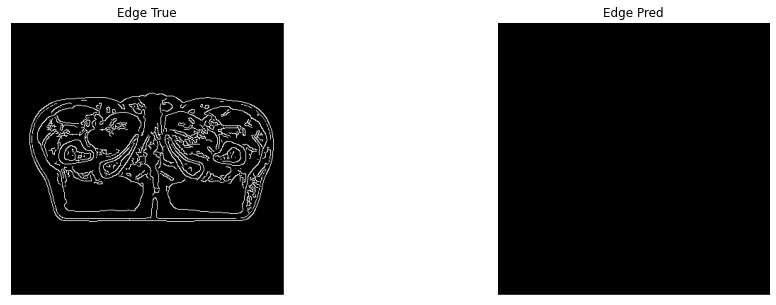

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

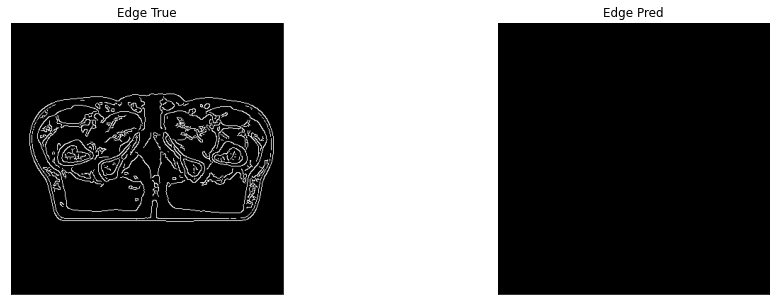

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

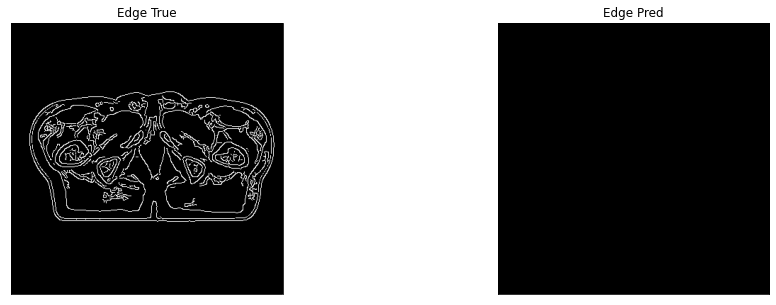

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

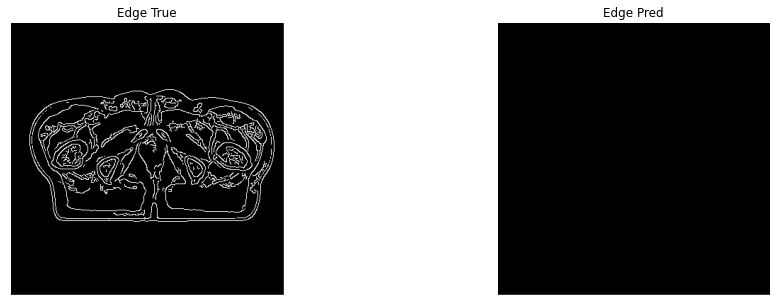

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

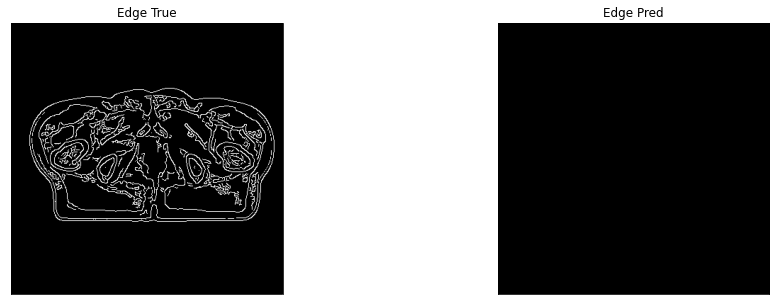

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

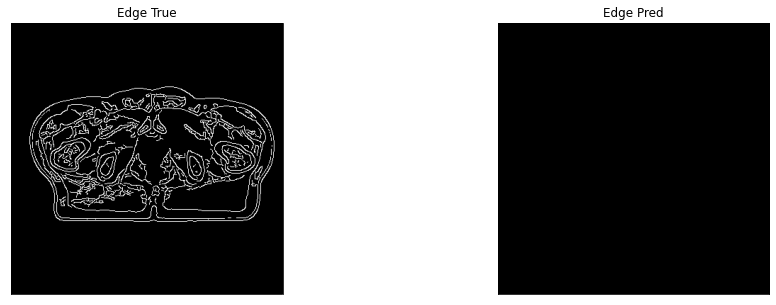

4it [00:12,  3.14s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

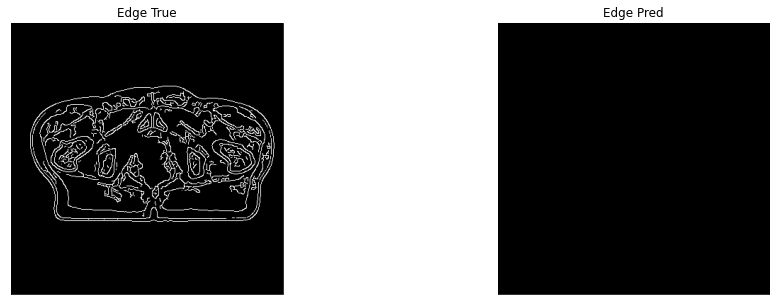

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

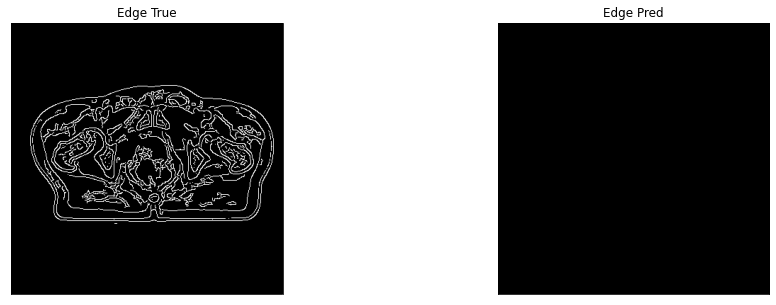

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

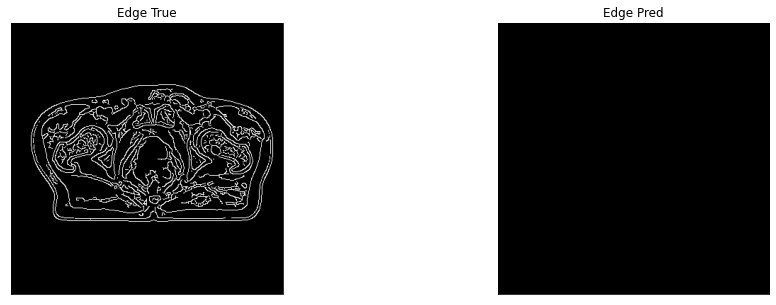

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

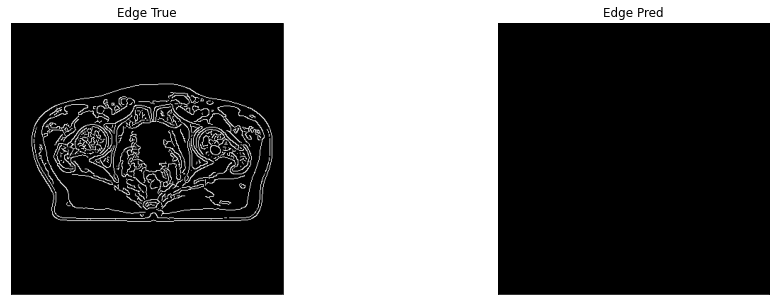

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

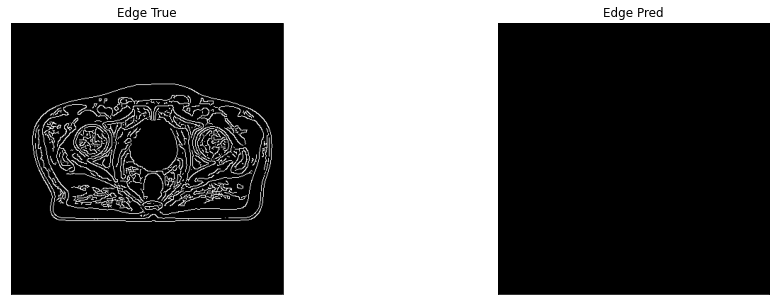

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

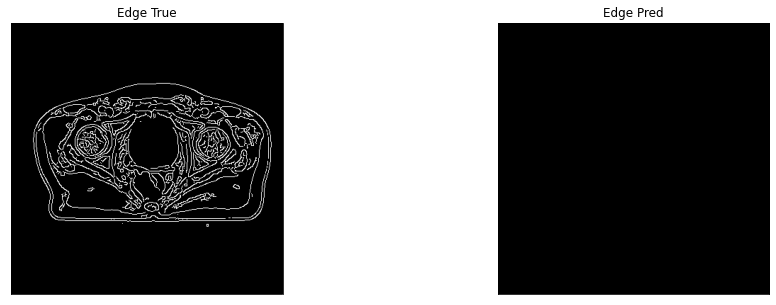

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

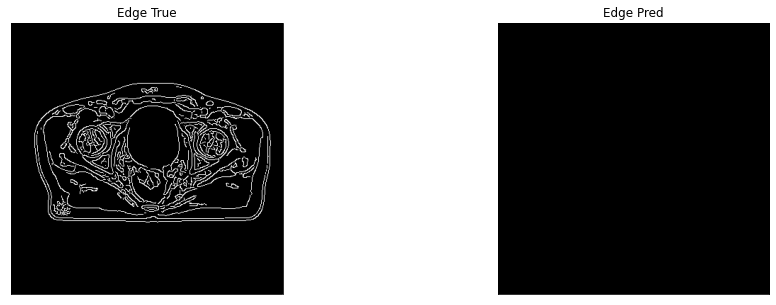

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

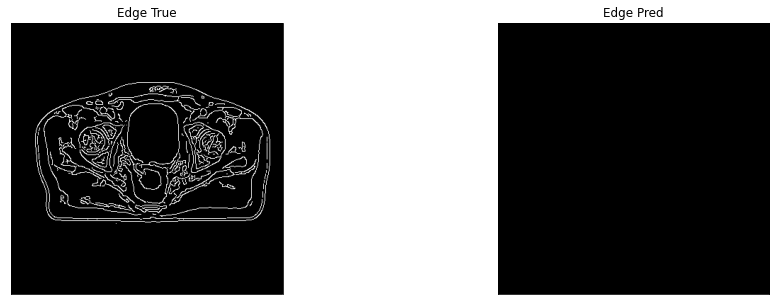

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

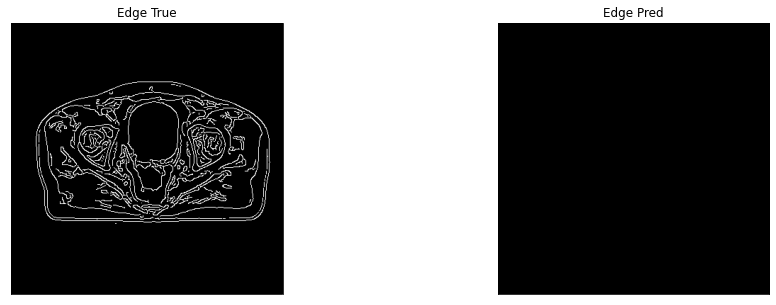

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

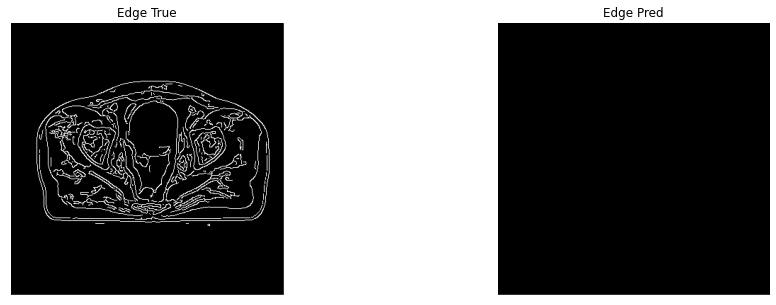

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

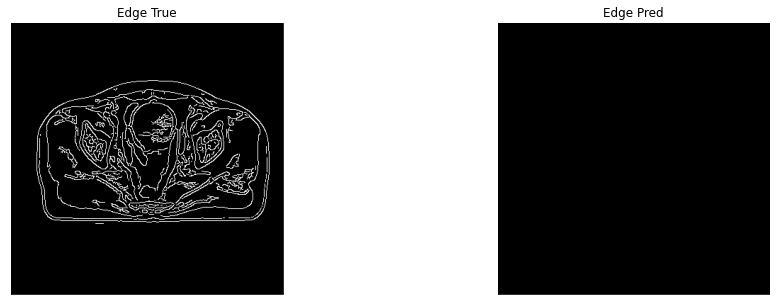

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

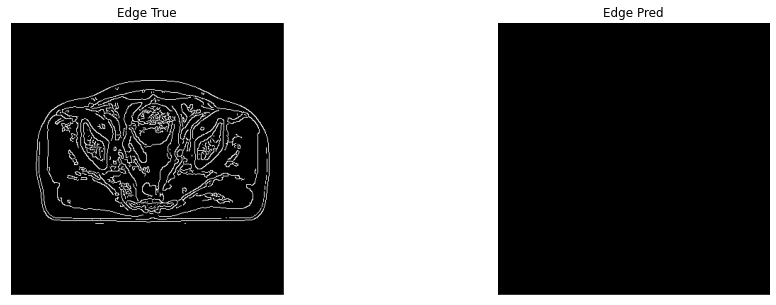

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

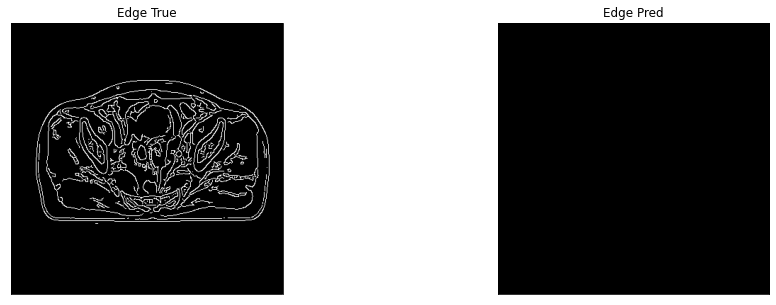

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

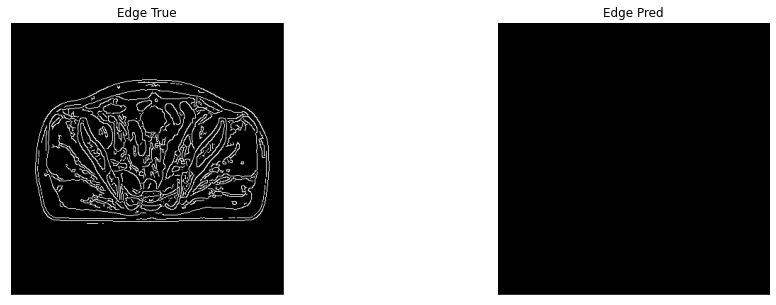

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

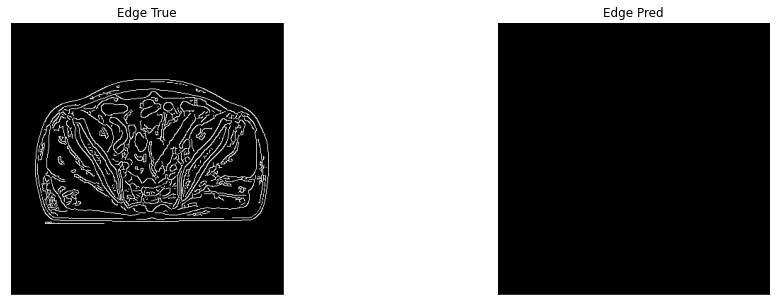

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

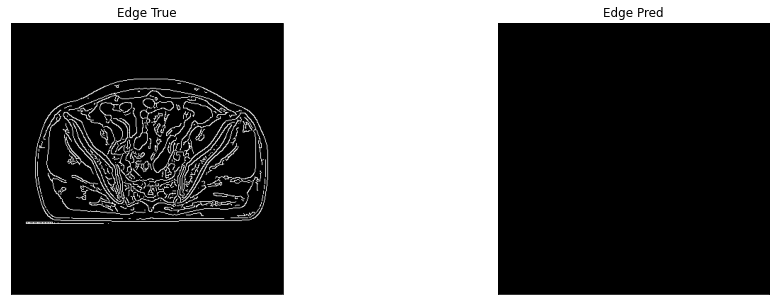

5it [00:15,  3.17s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

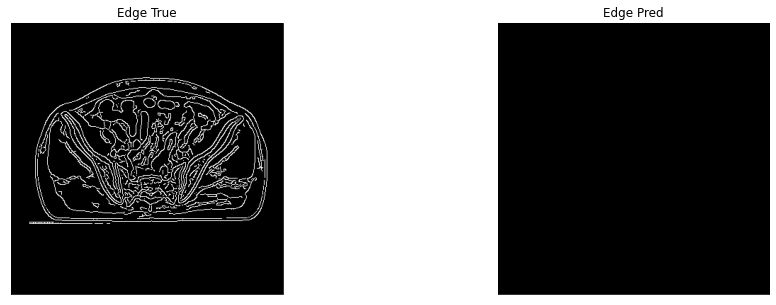

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

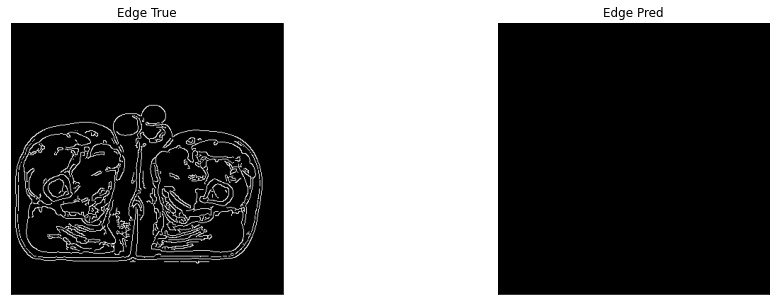

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

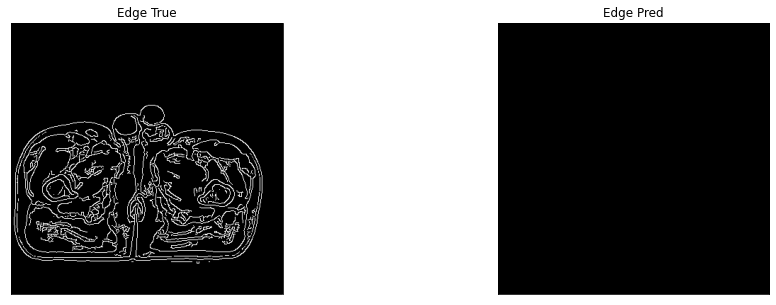

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

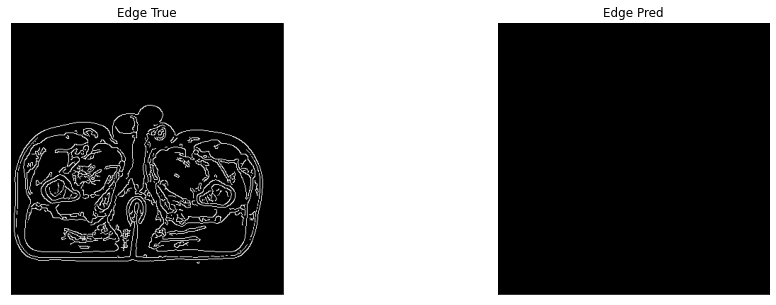

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

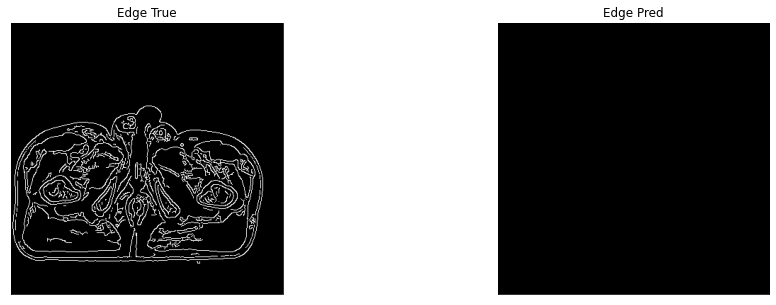

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

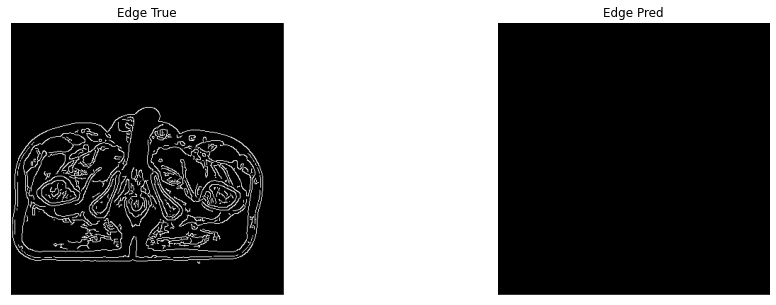

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

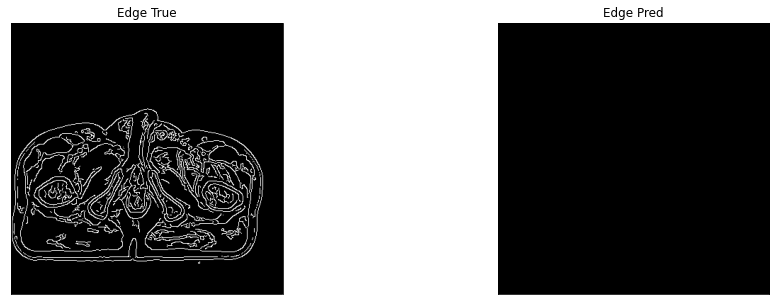

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

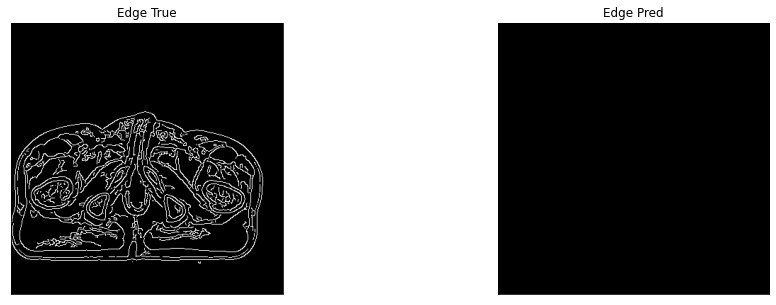

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

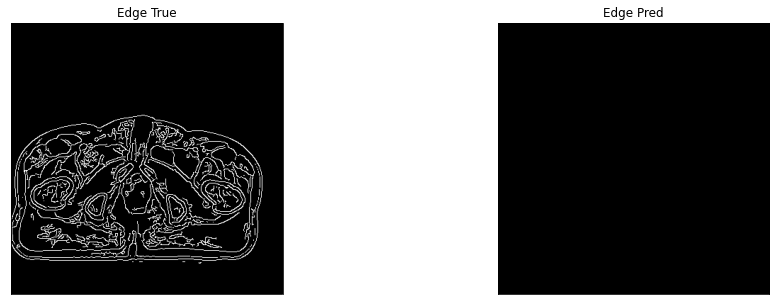

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

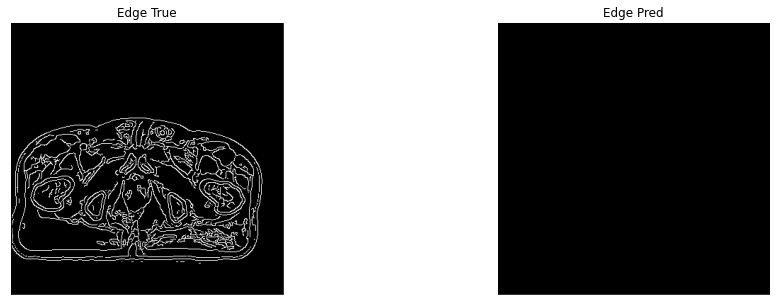

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

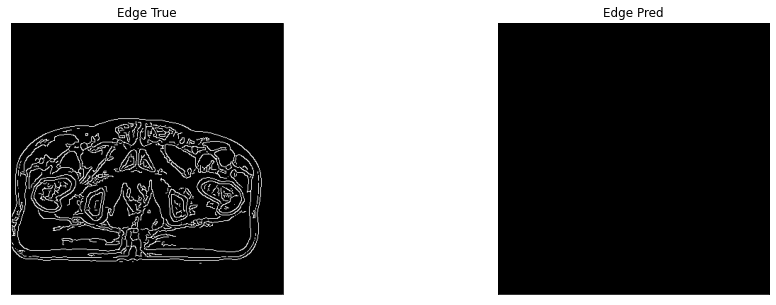

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

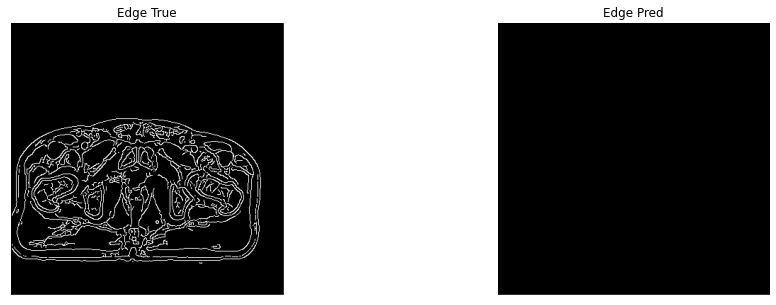

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

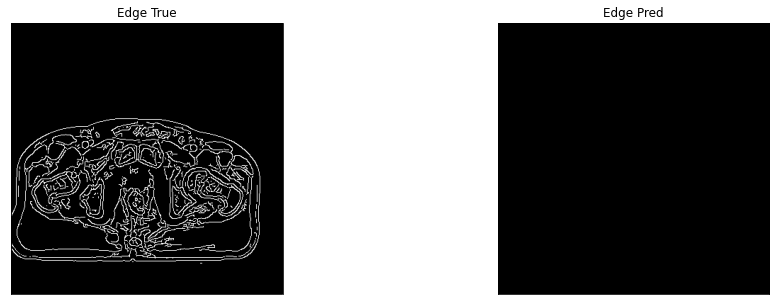

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

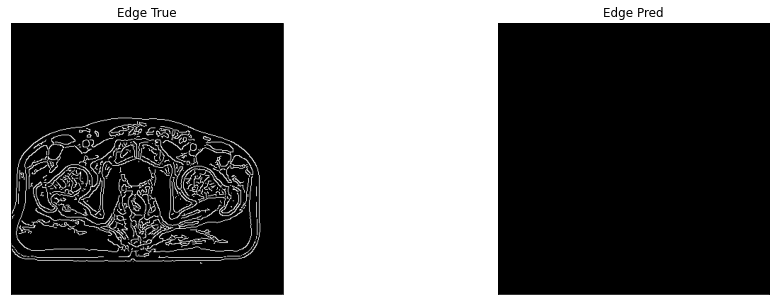

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

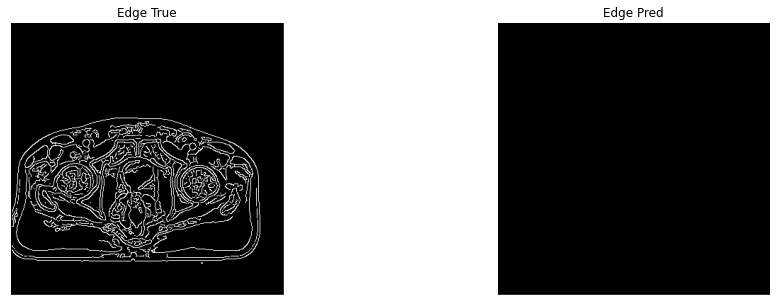

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

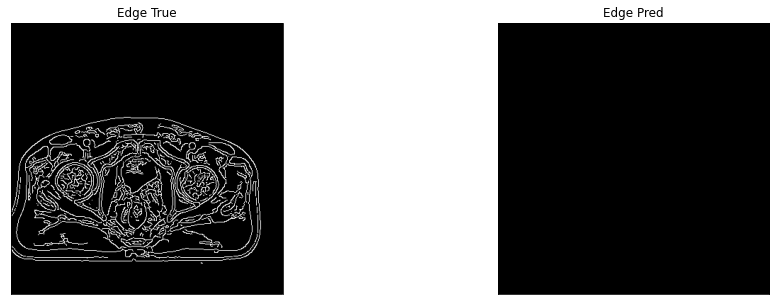

6it [00:18,  3.06s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

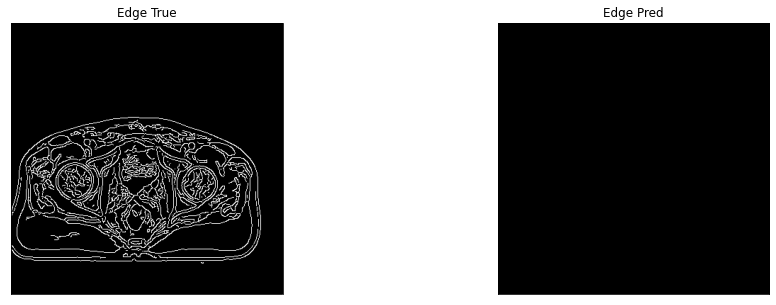

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

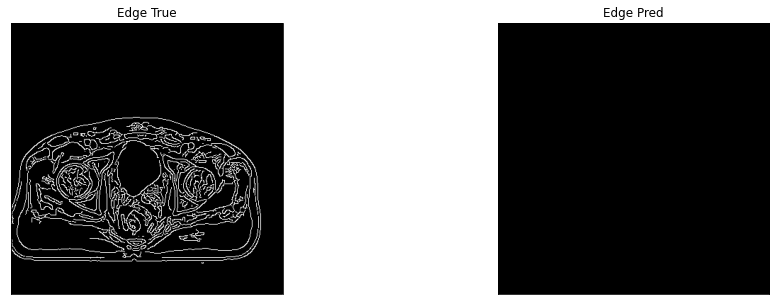

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

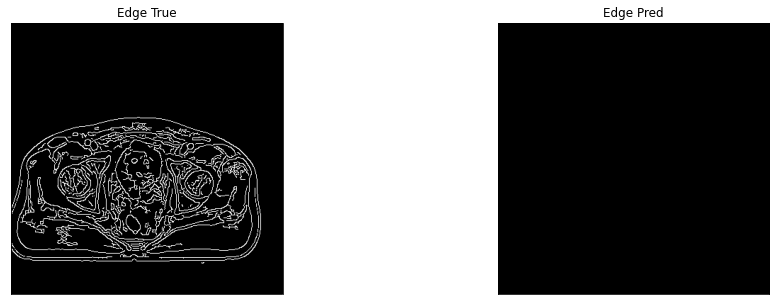

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

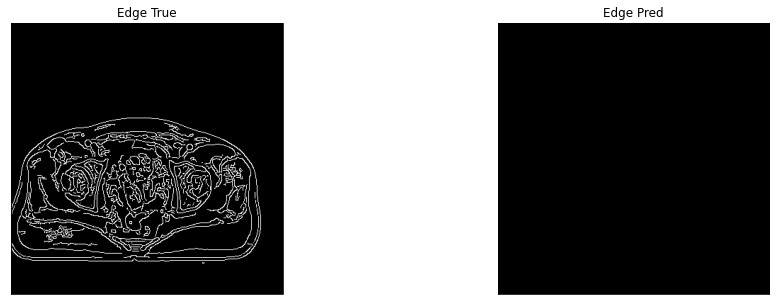

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

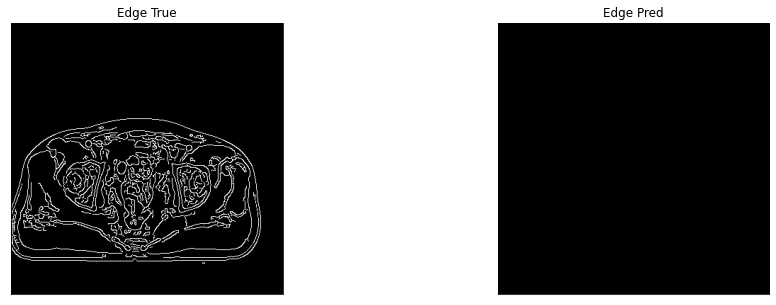

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

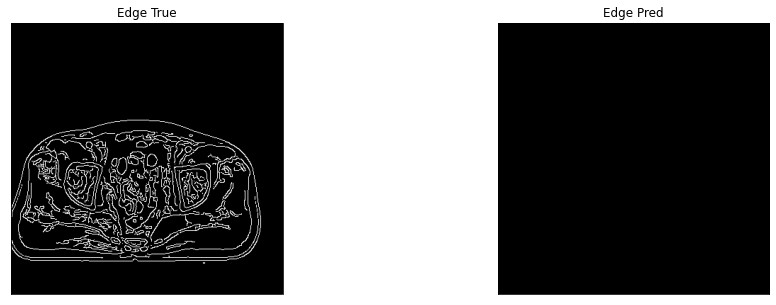

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

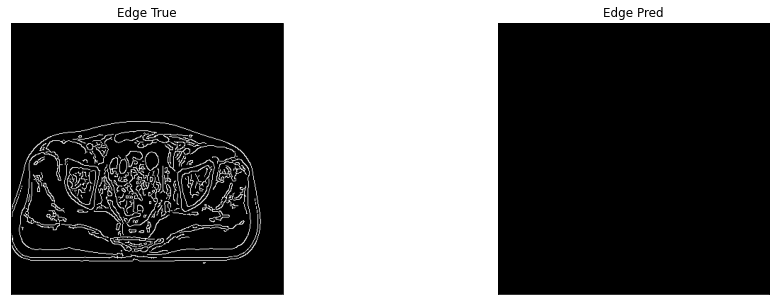

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

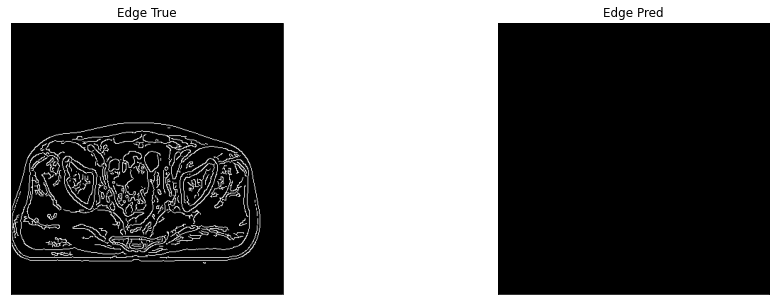

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

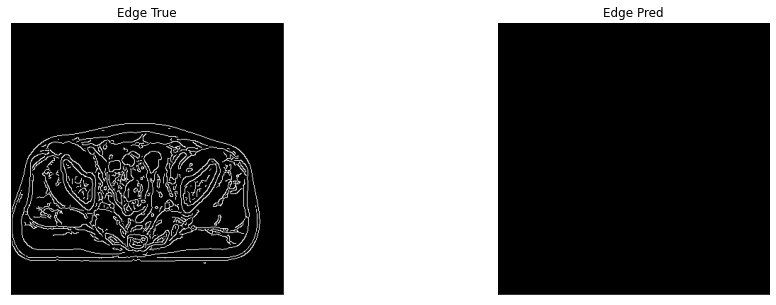

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

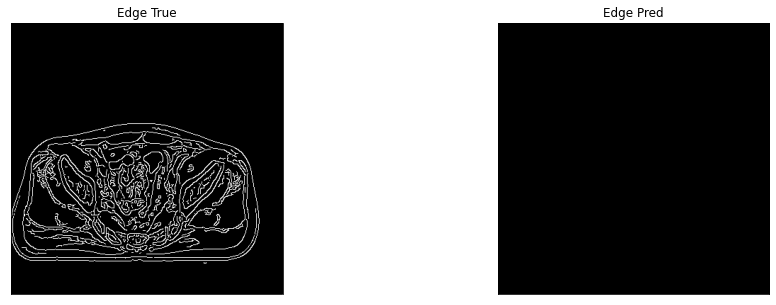

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

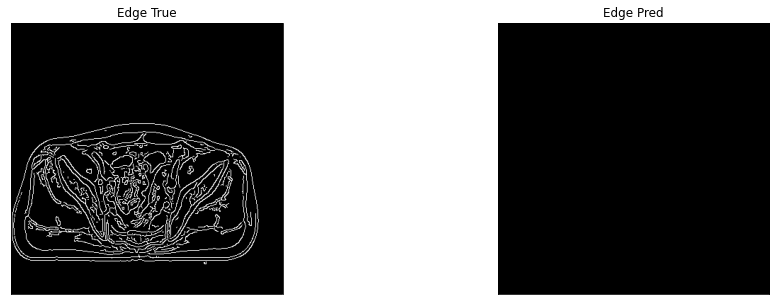

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

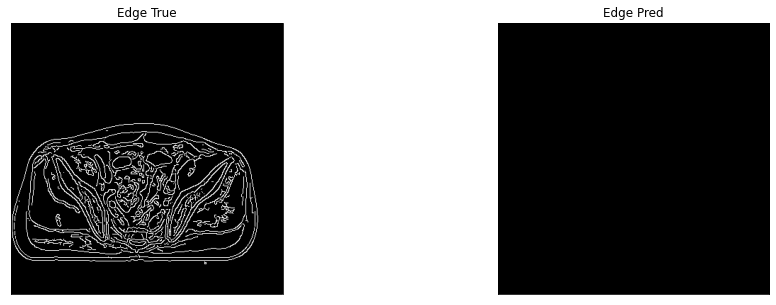

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

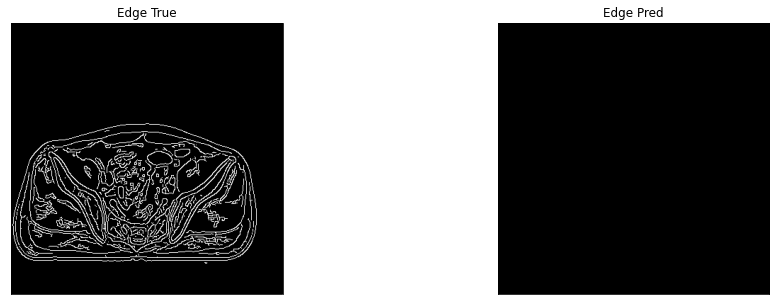

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

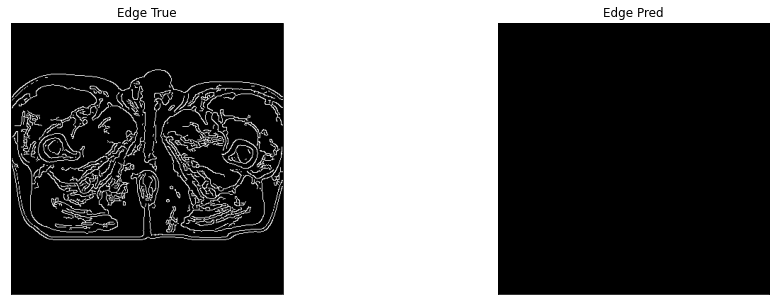

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

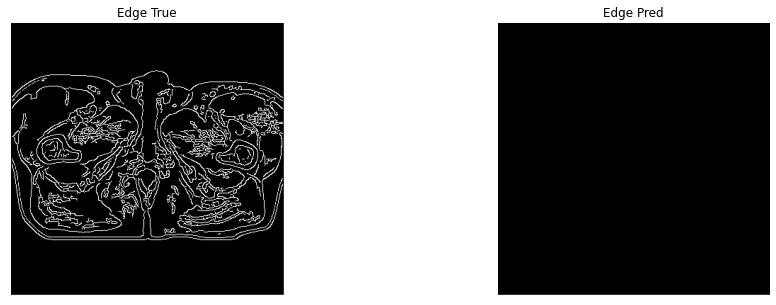

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

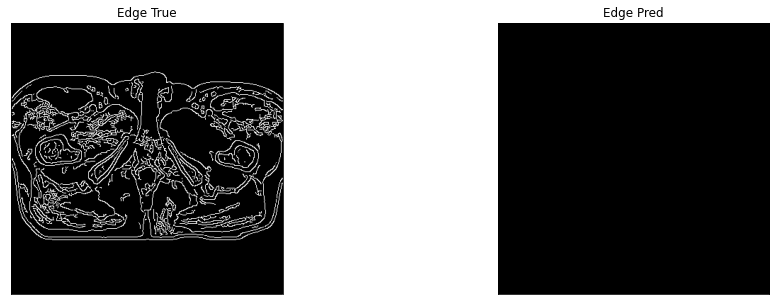

7it [00:21,  2.92s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

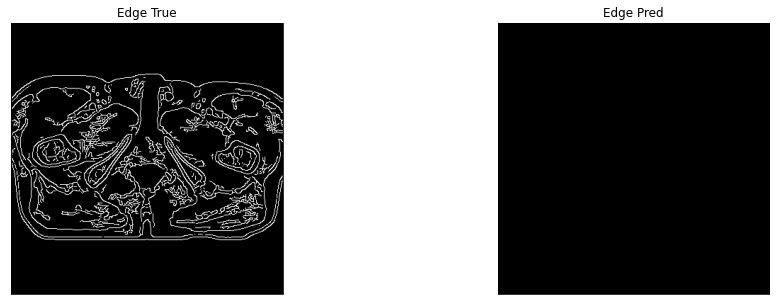

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

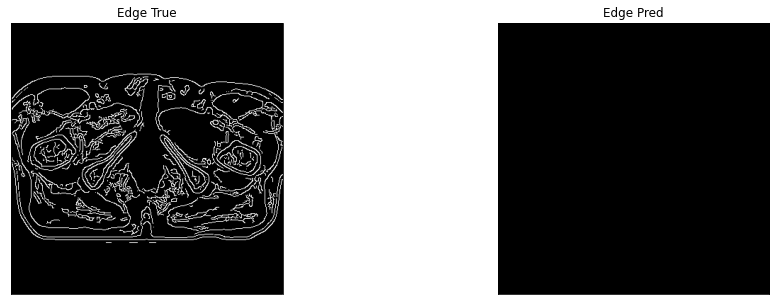

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

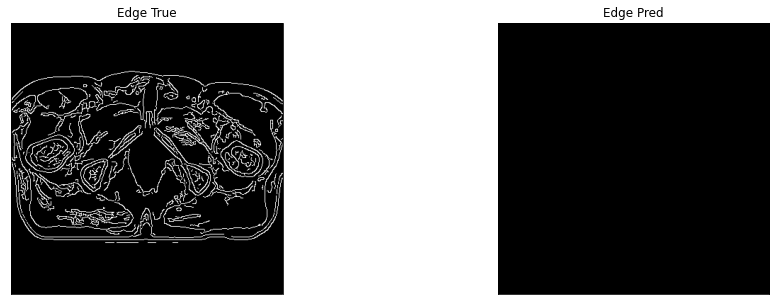

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

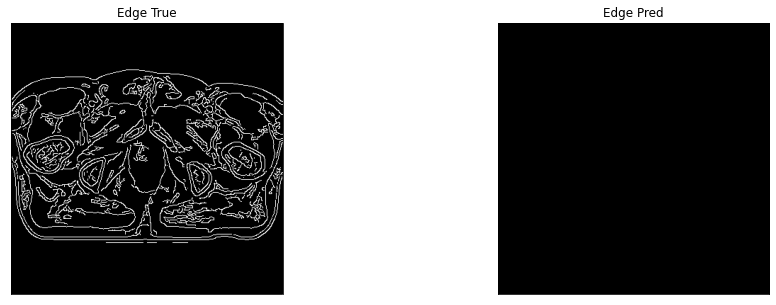

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

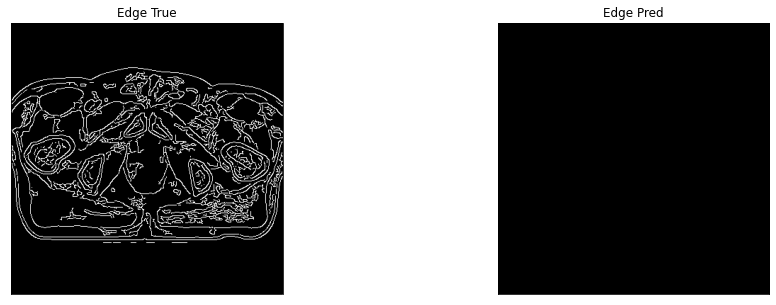

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

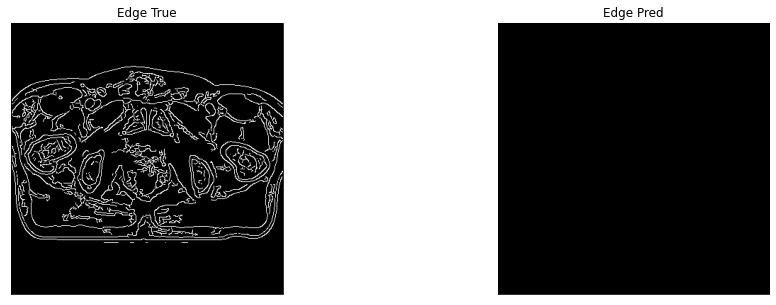

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

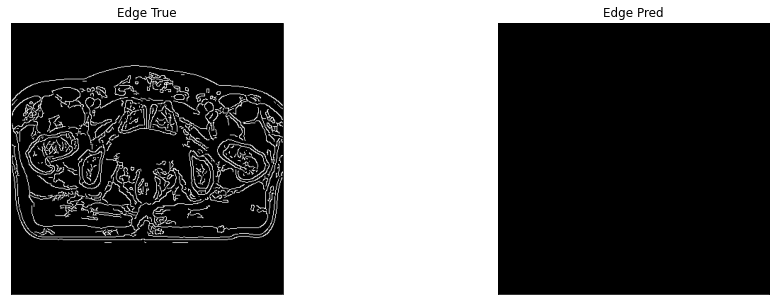

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

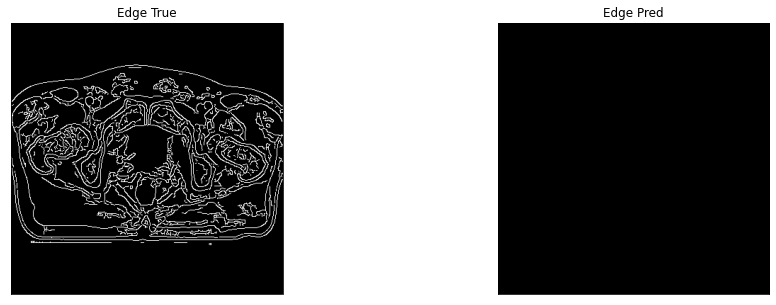

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

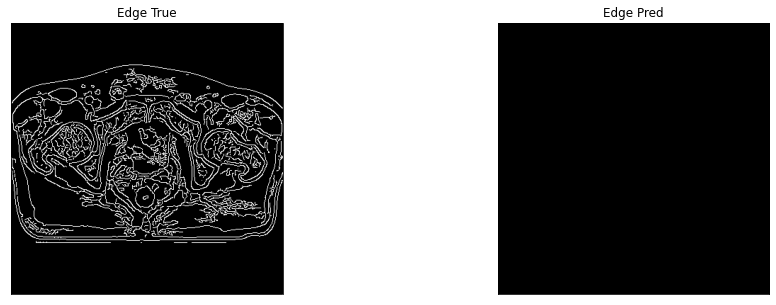

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

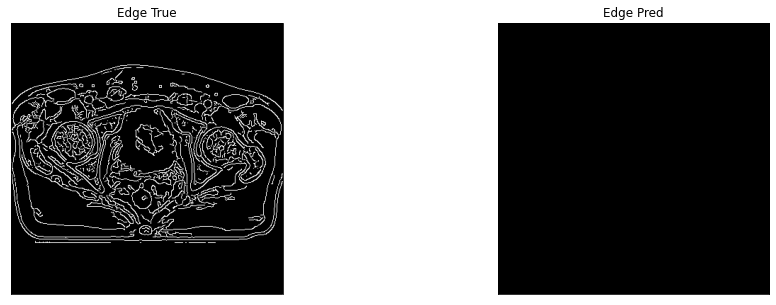

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

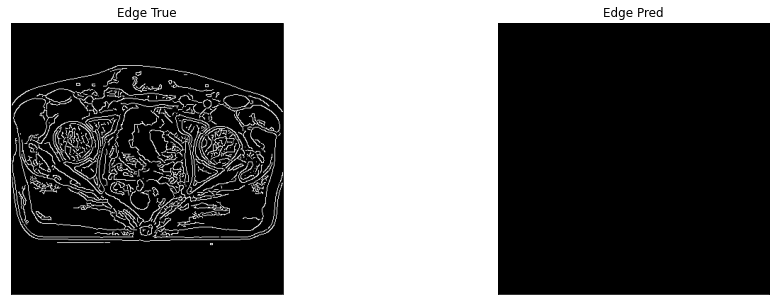

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

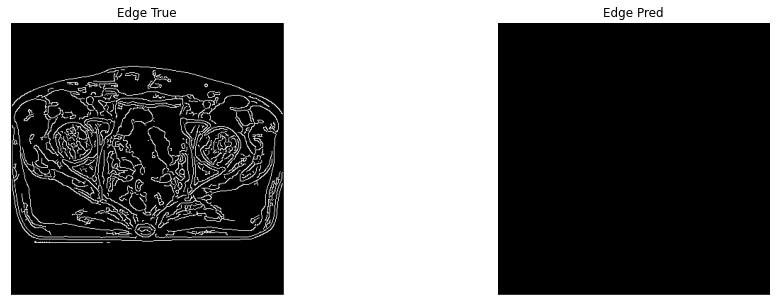

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

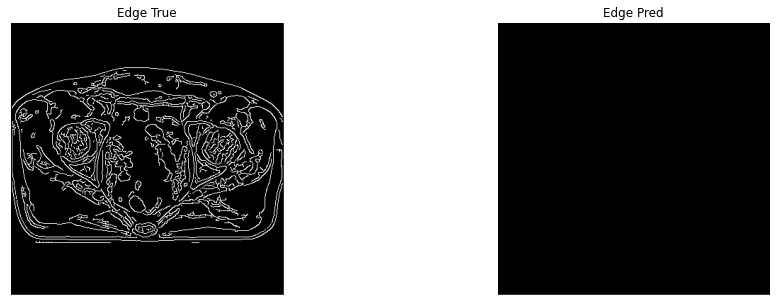

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

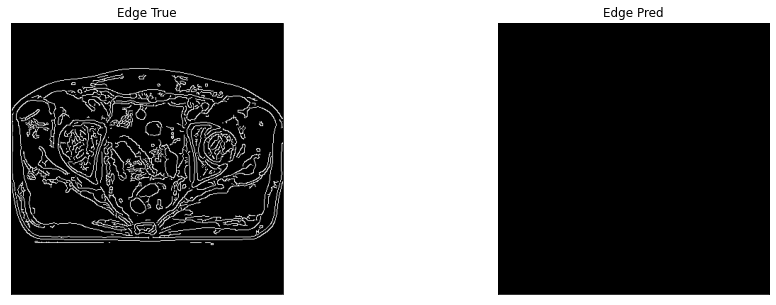

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

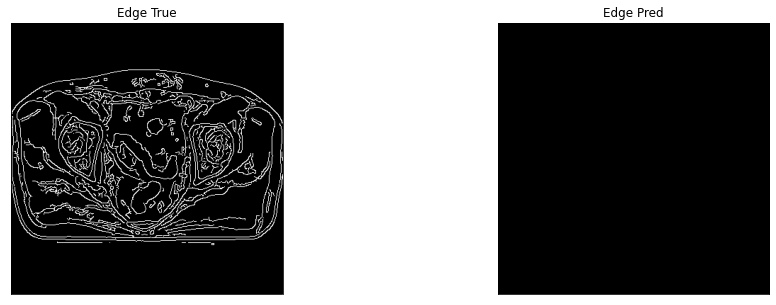

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

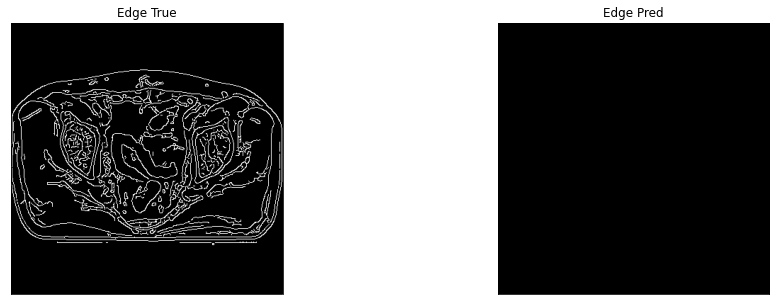

8it [00:24,  2.96s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

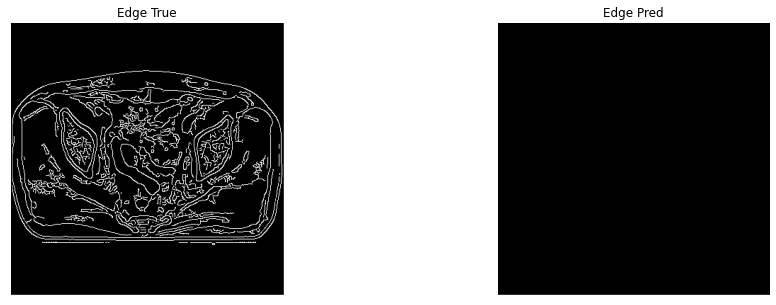

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

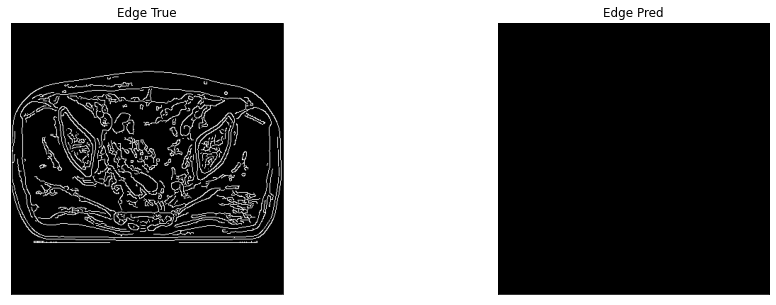

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

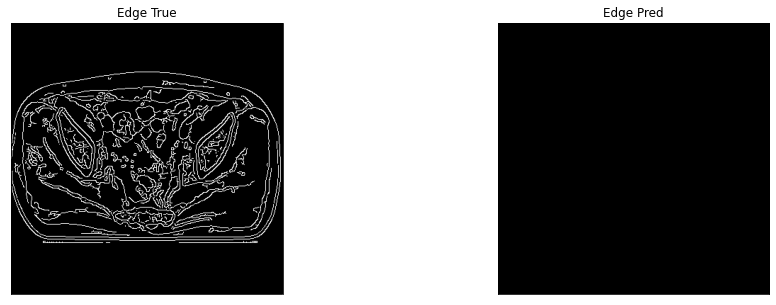

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

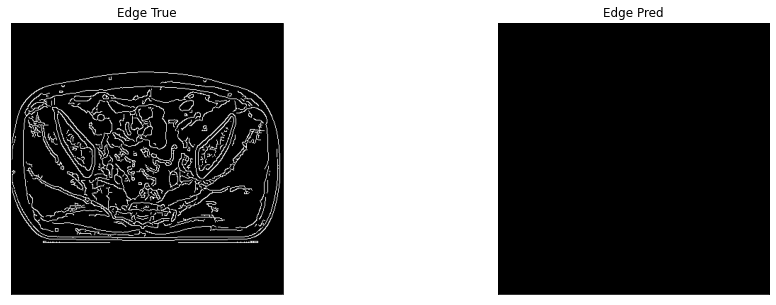

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

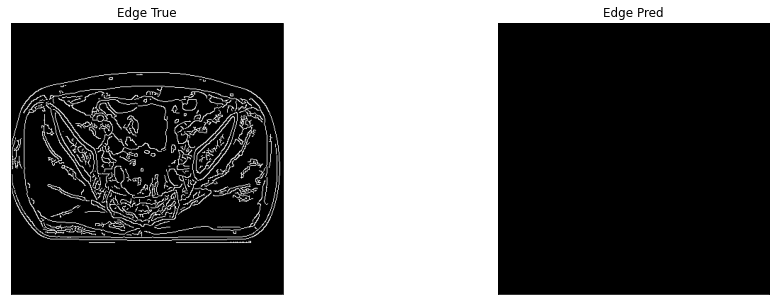

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

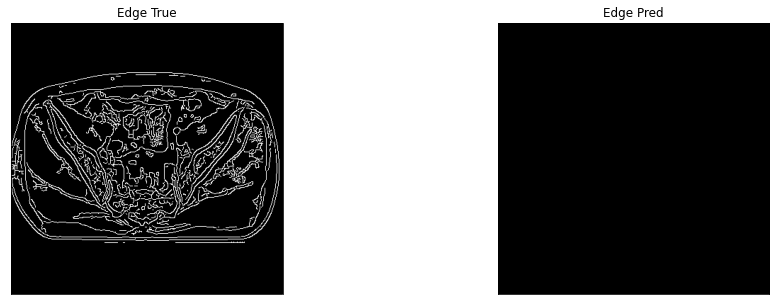

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

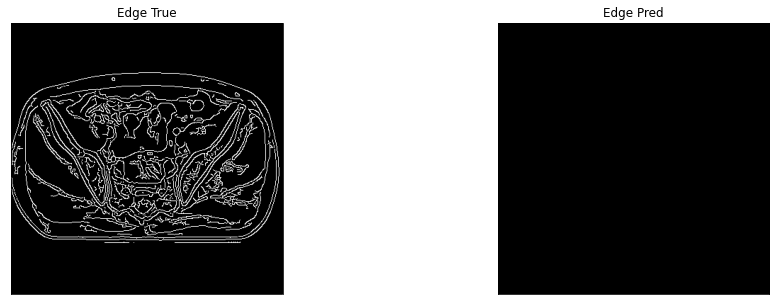

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

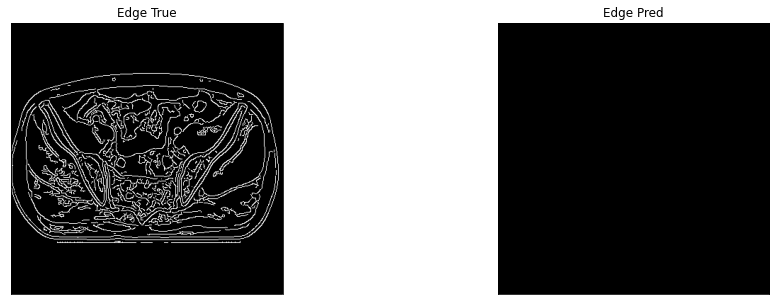

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

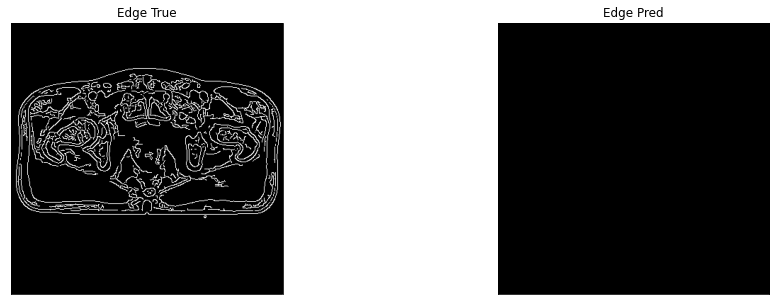

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

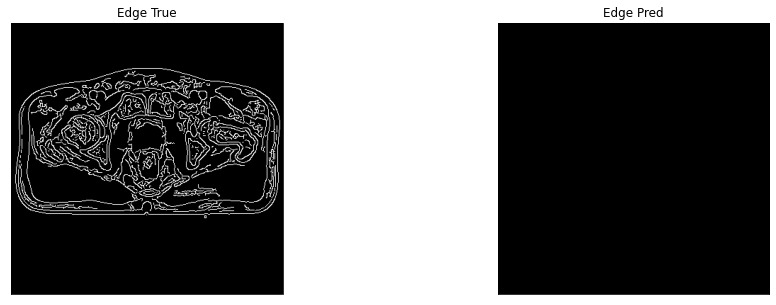

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

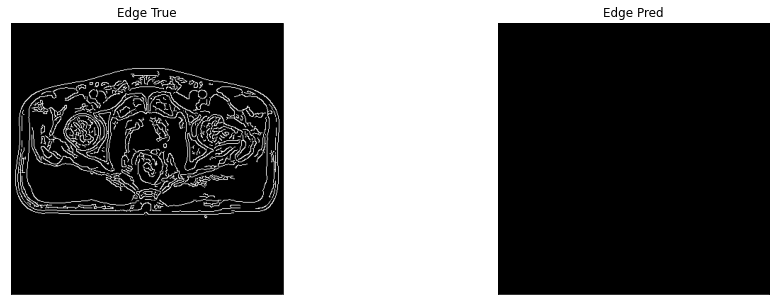

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

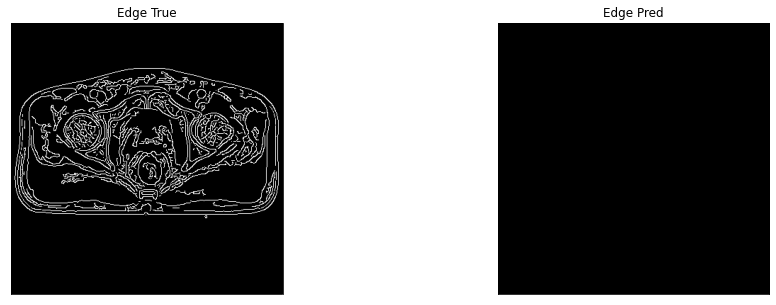

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

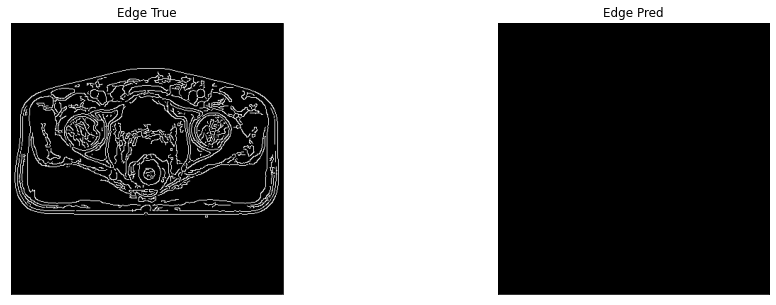

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

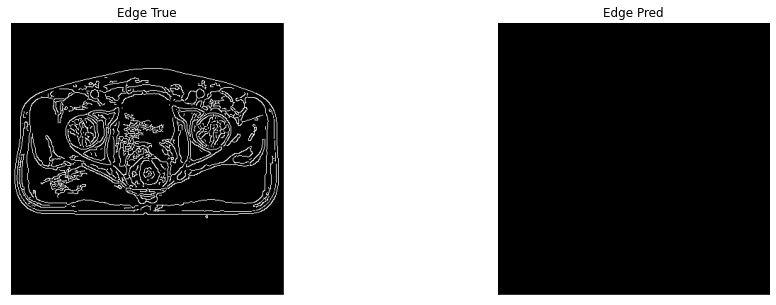

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

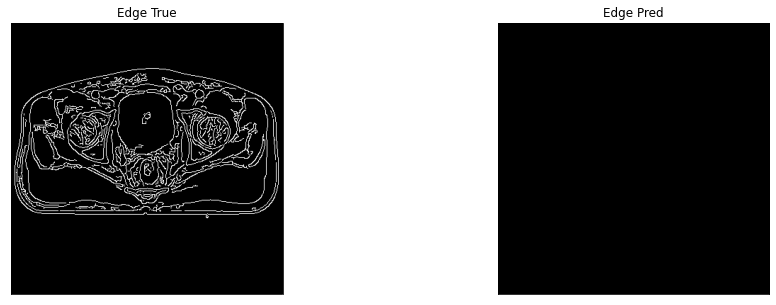

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

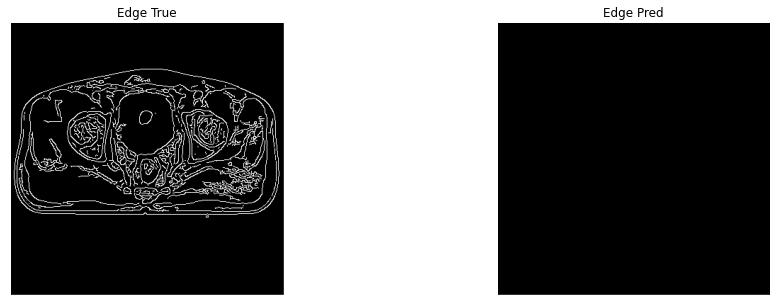

9it [00:27,  2.99s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

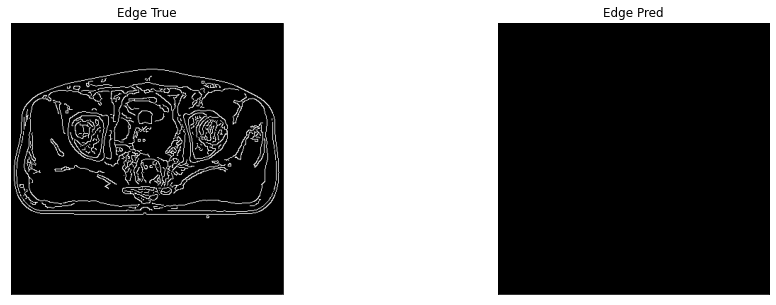

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

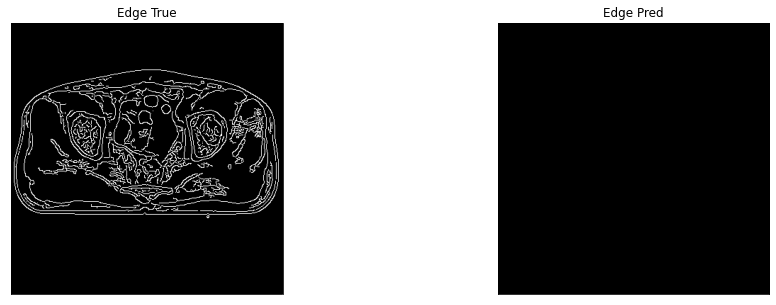

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

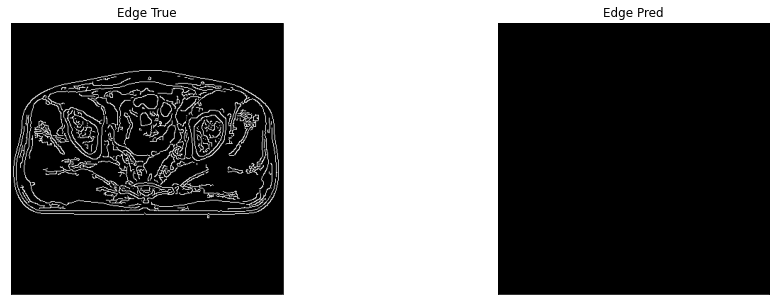

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

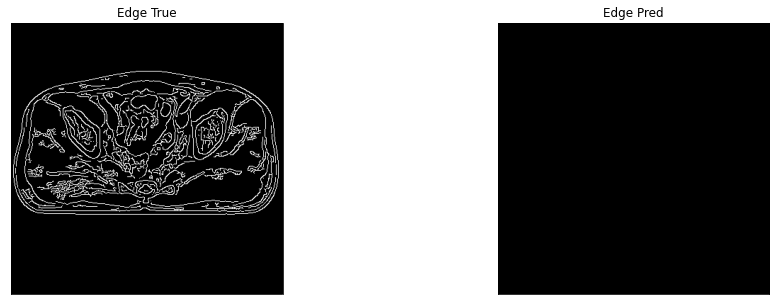

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

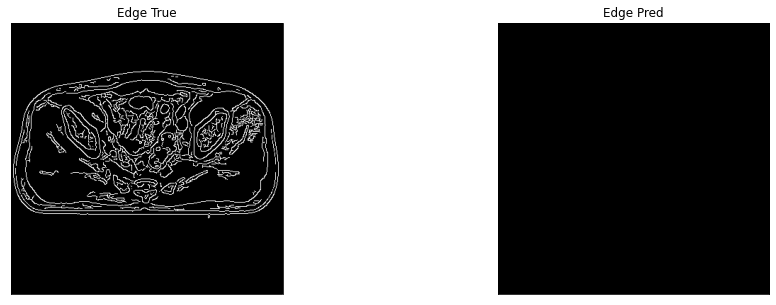

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

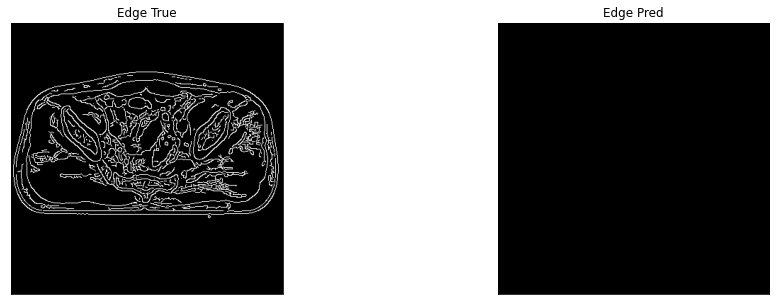

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

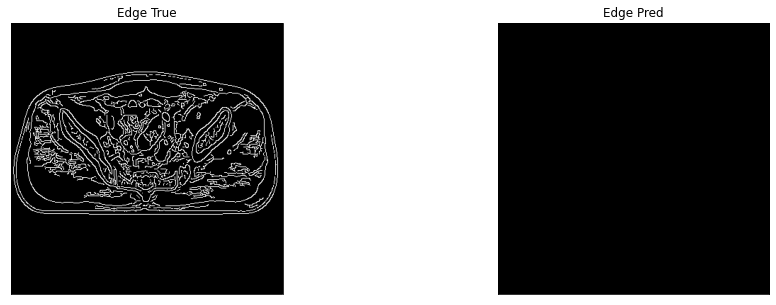

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

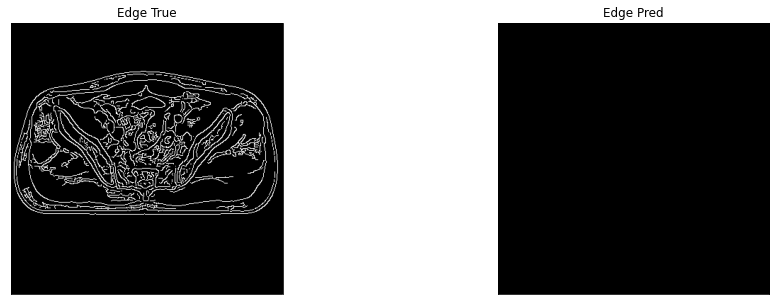

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

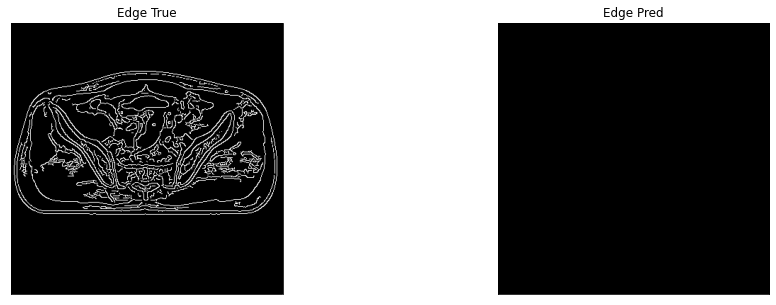

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

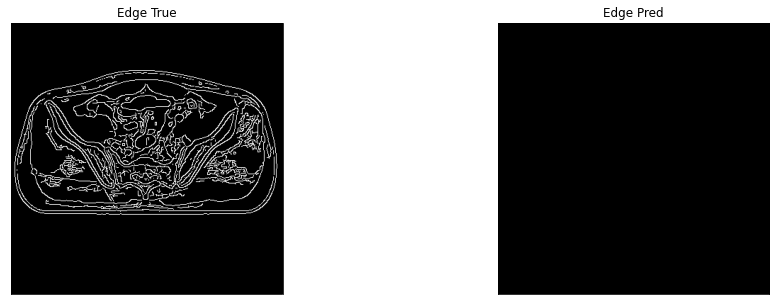

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

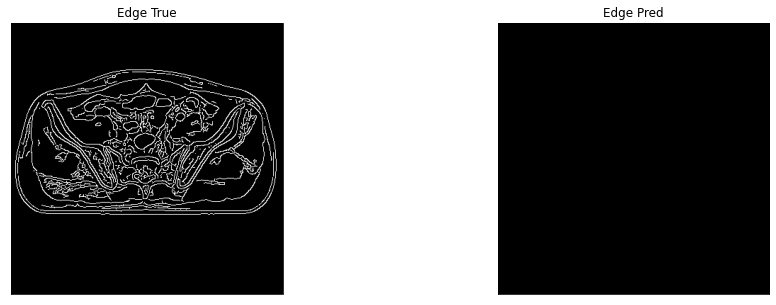

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

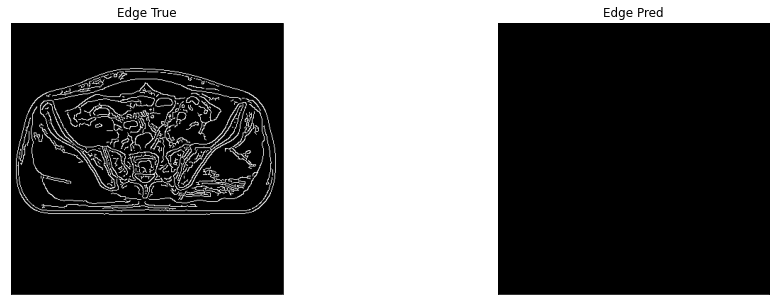

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

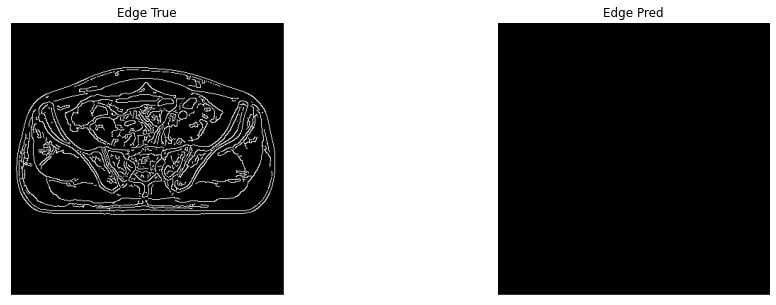

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

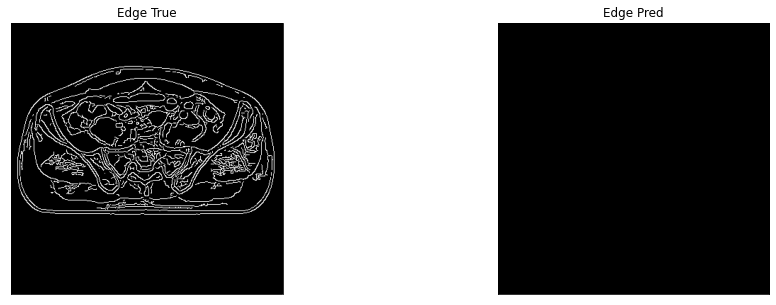

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

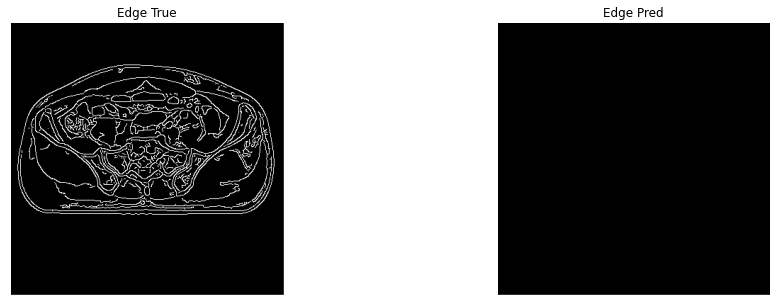

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

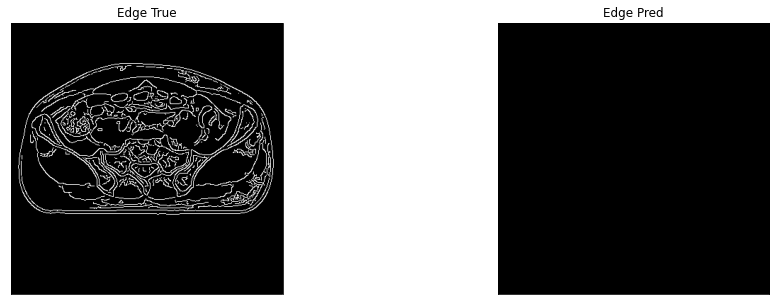

10it [00:30,  2.95s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

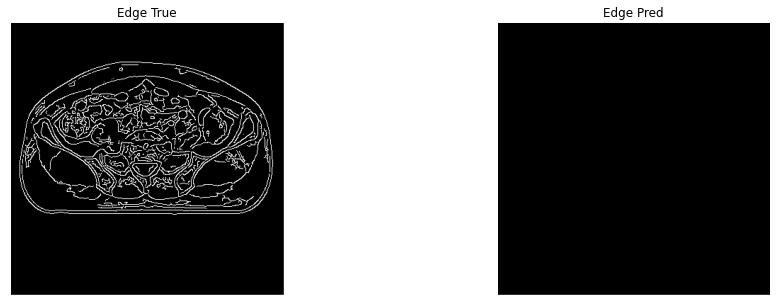

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

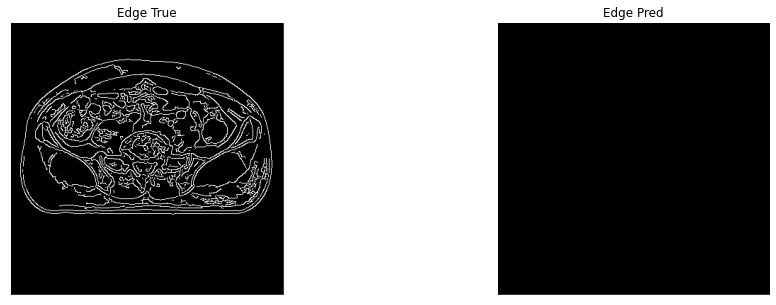

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

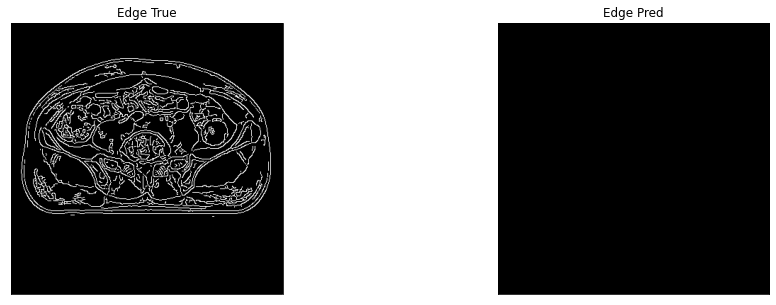

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

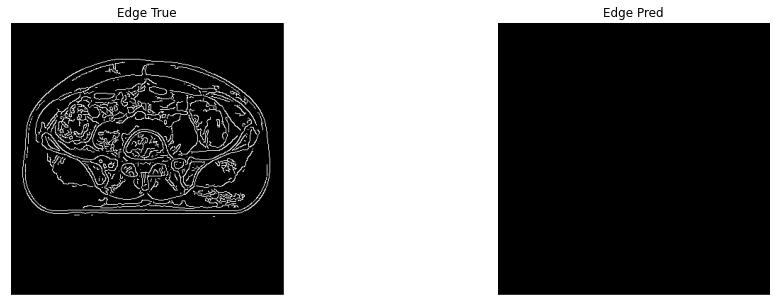

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

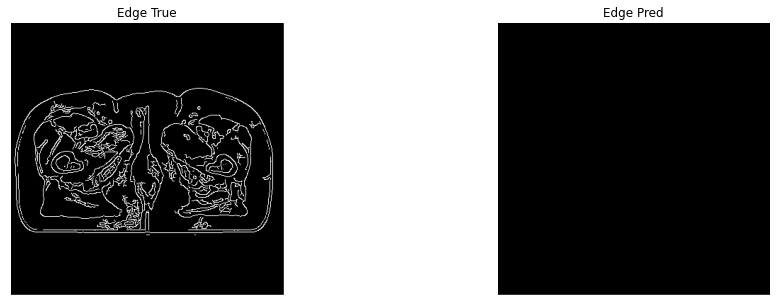

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

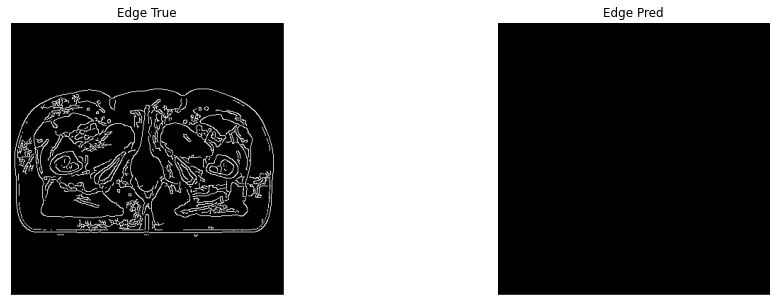

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

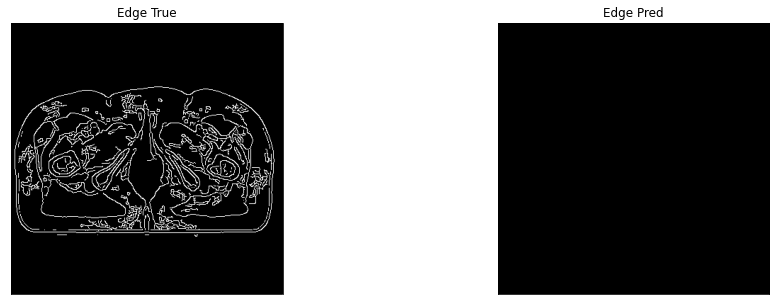

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

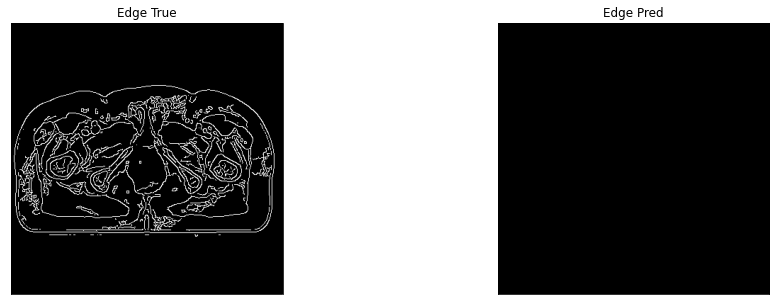

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

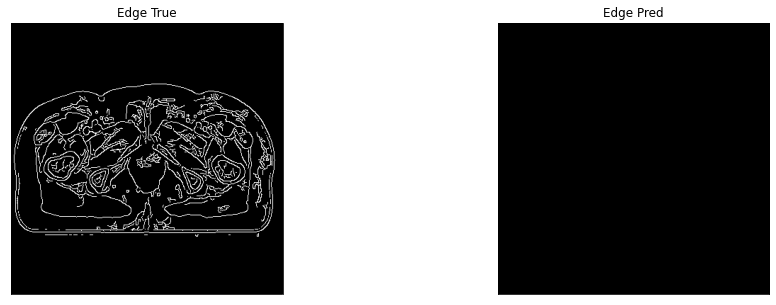

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

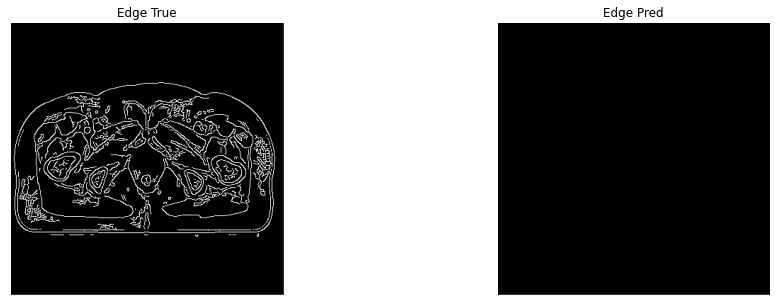

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

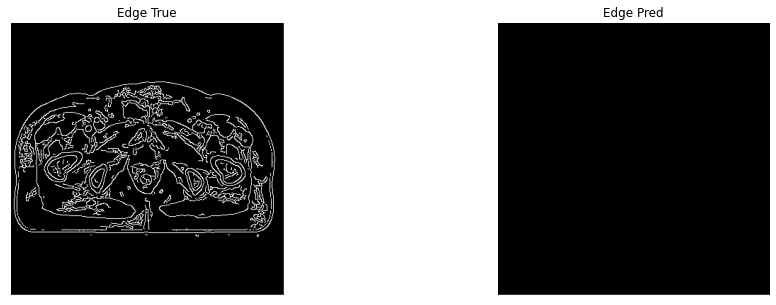

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

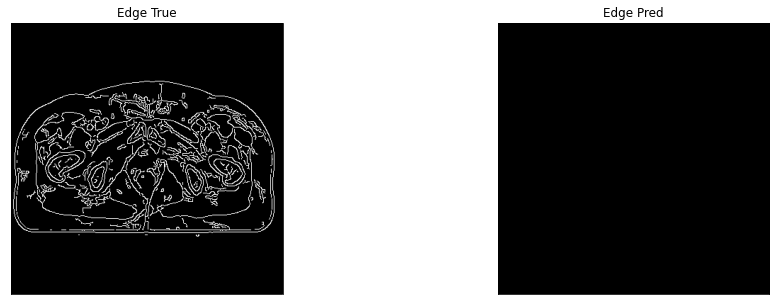

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

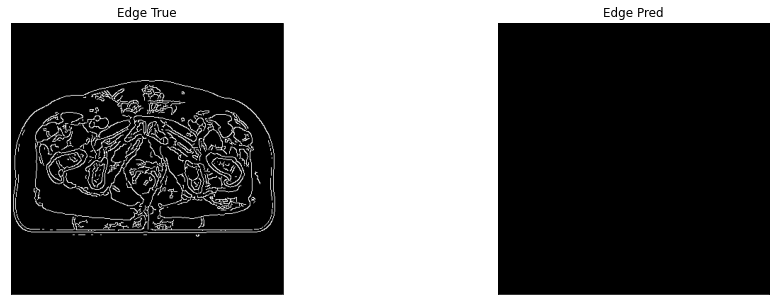

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

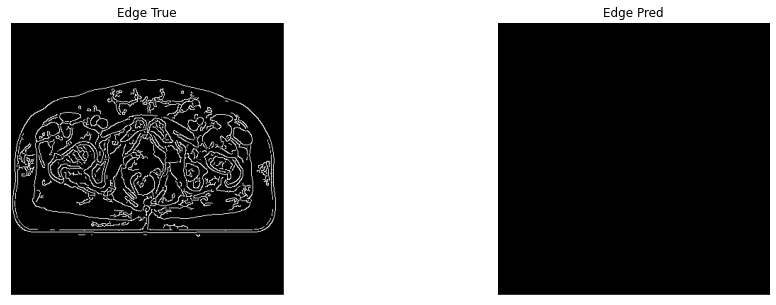

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

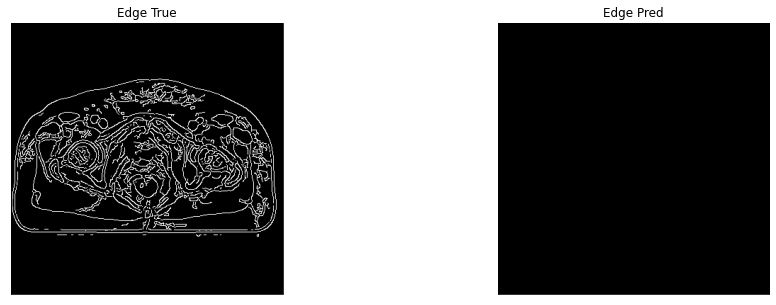

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916,
        0.4916, 0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

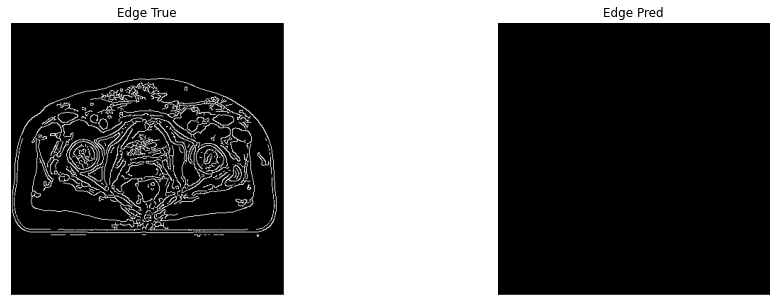

11it [00:33,  2.96s/it]

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

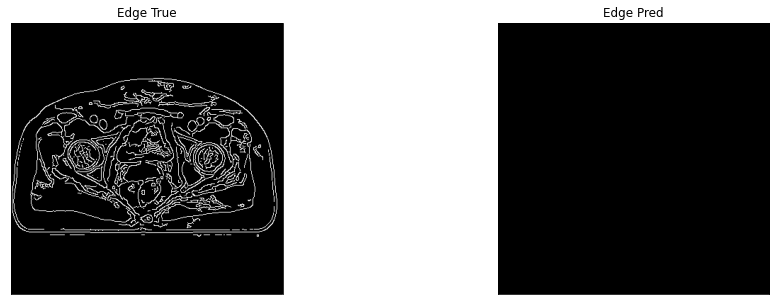

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

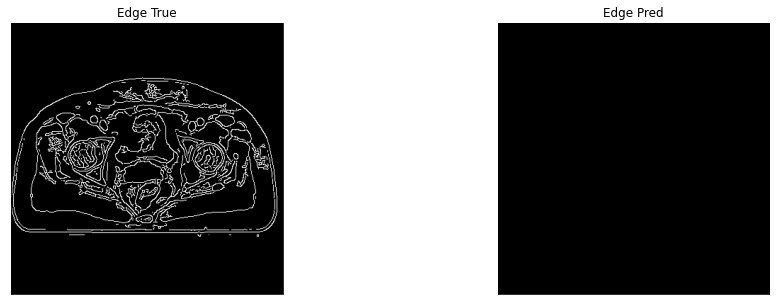

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

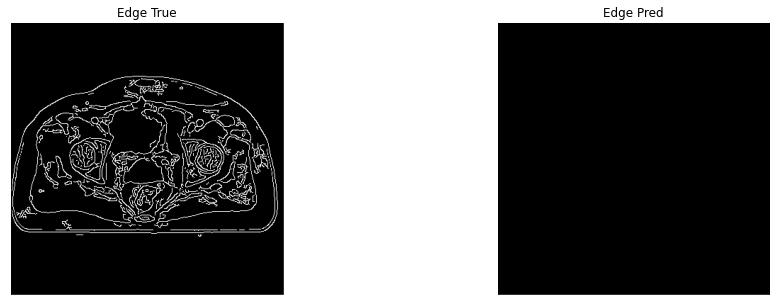

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

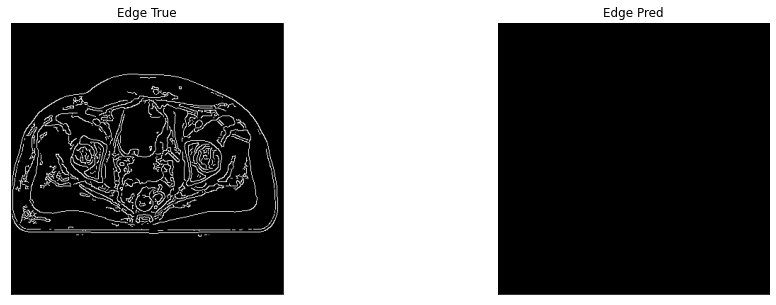

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

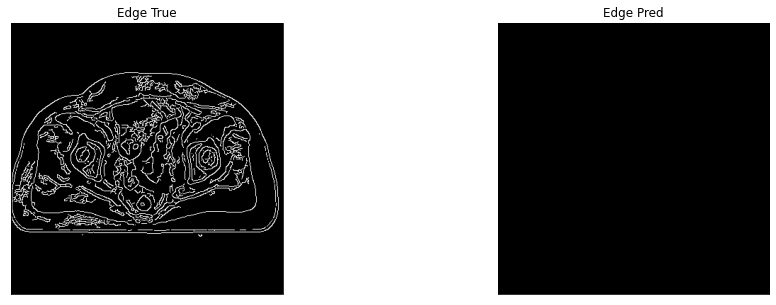

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916,
        0.4918, 0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4931, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

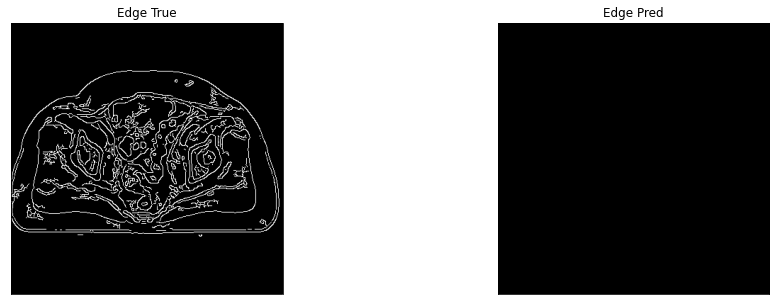

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

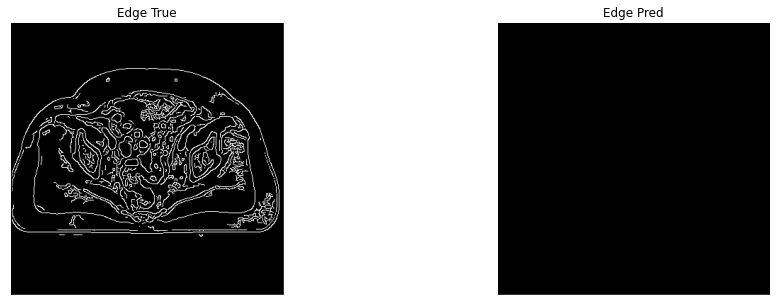

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

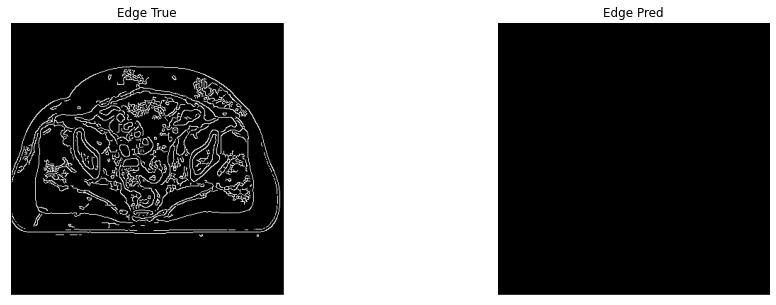

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

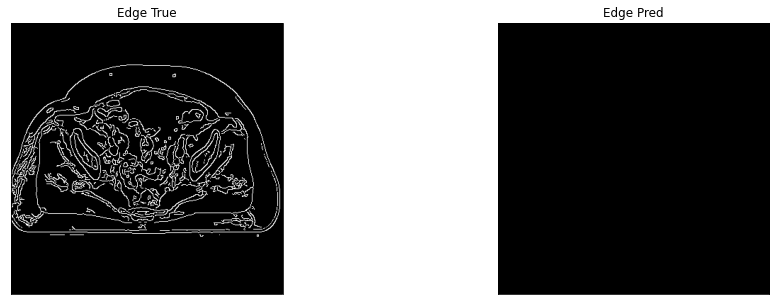

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

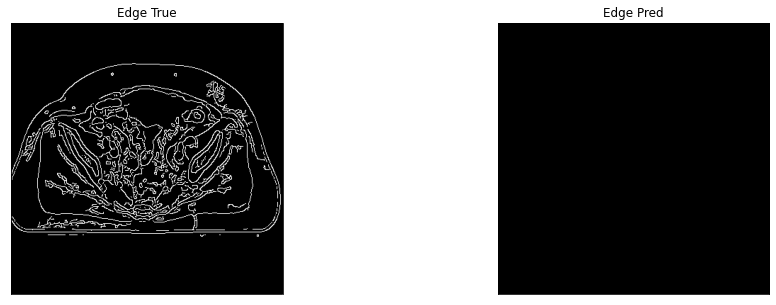

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

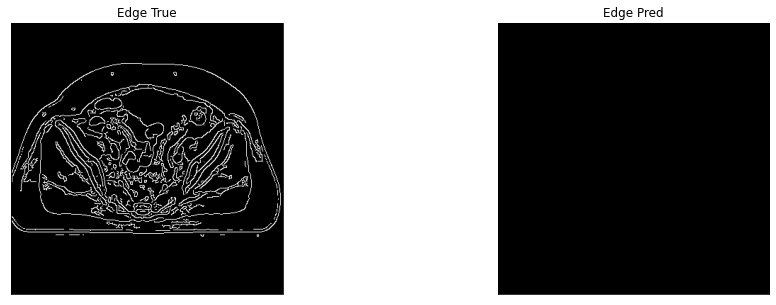

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

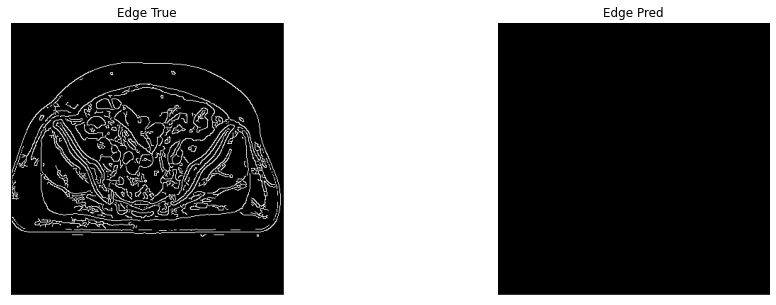

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918, 0.4920,
        0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

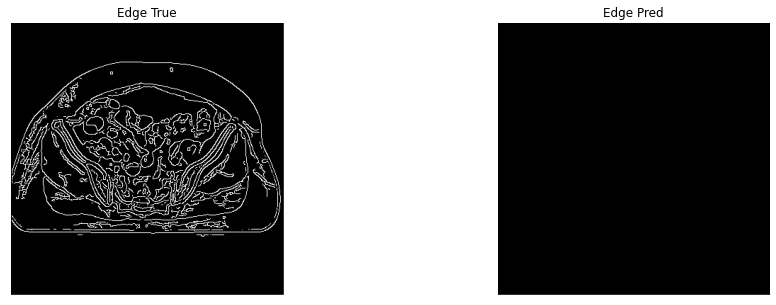

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

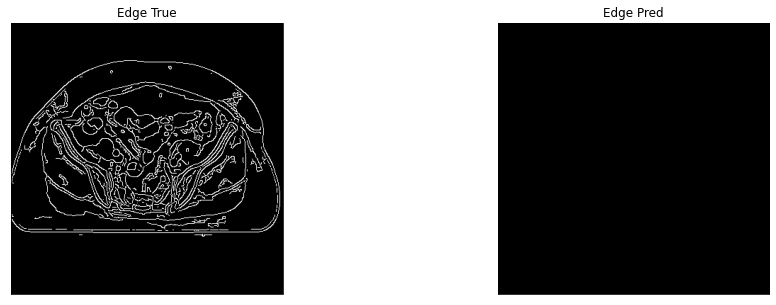

edge of ct_pred = 0.5, edge of ct_true = 0.5
tensor([0., 1.], device='cuda:0') tensor([0.4903, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913, 0.4913,
        0.4913, 0.4913, 0.4913, 0.4914, 0.4914, 0.4914, 0.4914, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915, 0.4915,
        0.4915, 0.4915, 0.4915, 0.4915, 0.4916, 0.4916, 0.4916, 0.4916, 0.4918,
        0.4920, 0.4925, 0.4926, 0.4926, 0.4931, 0.4931, 0.4931, 0.4931, 0.4931,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932, 0.4932,
        0.4932, 0.4932, 0.4932, 0.4932, 0

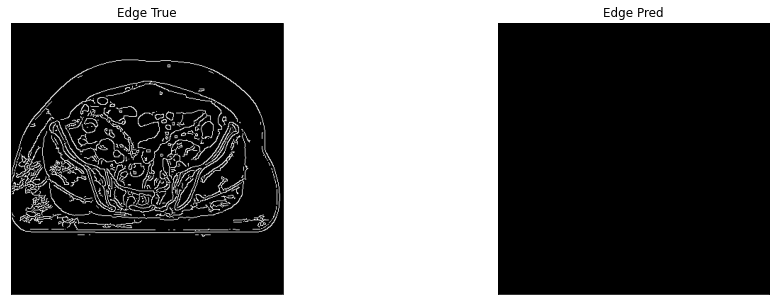

12it [00:35,  2.99s/it]


In [44]:
test_epoch(model, testloader, device, True, dir_path)

In [ ]:
discriminator = Model(in_channel=DIS_IN_CHANNELS, n_classes=DIS_N_CLASSES, activation=DIS_ACT)

In [ ]:
discriminator.load_state_dict(checkpoint["dicriminator"])

In [ ]:
# score_ssim_test, score_psnr_test, score_snr_test, score_mae_test, score_mask_test, score_acc_test 
# unmasked
eval_epoch(model, discriminator, testloader, device)

In [ ]:
# import torchvision.models as models
# models.vgg16(pretrained=True)